In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import pymc as pm
import arviz as az

from math import log10, floor

useratiodata=1 #1 for Scenario B to incorporate ratio data, 0 otherwise
sigmadeterministic=1 #0 to assign Inverse Gamma prior on variance of noise variables, otherwise plug in estimates will be used. 

In [4]:
dataflows = pd.read_csv("Aggregate_Flow_Simple_V8.txt",comment='#')
datastocks = pd.read_csv("Aggregate_Stock_Simple_V8.txt",comment='#')

scale=1.0 #1000.0

#sigmastd=0.1 #0.01 #3.0

datastocks['quantity']=datastocks['quantity']/scale
dataflows['quantity']=dataflows['quantity']/scale

from preprocessingagg import preprocessing, createdesignmatrix, createratiomatrix, createcompactmatrix, createcompactratiomatrix
from prior import round_to_poweroften, definepriors
from model import mfamodel
from posteriorpredictive import filelabeler, ppplots, ppplotsratiodata, top10hdi

availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, processnamesdict, allflownumbersmatrix, m, N, massconservedindices=preprocessing(datastocks,dataflows)

print('check mass conserved indices')
print(massconservedindices)

#construct the prior

dataflowspriors = pd.read_csv("Aggregate_Flow_Prior_Simple_V8.txt",comment='#')
datastockspriors = pd.read_csv("Aggregate_Stock_Prior_Simple_V8.txt",comment='#')

#compact prior code from aluminium code
#priormean,covariancevec,truevalues=definepriors(datastockspriors, dataflowspriors, availabledatafull, m, N)

#non compact code

#priormean = np.array([dataavg] * N)
priormean = np.array([1000.0] * N)/scale
#covariancevec = (dataavg**2)  * np.ones(N)
covariancevec = 10000000.0  * np.ones(N)/scale**2 #100000.0  * np.ones(N)/scale

dataflowspriors['quantity']=dataflowspriors['quantity']/scale
datastockspriors['quantity']=datastockspriors['quantity']/scale


dataflowspriorchild=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriorfromparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 0)]
dataflowspriortoparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 0) & (dataflowspriors['ParentProcessFlowto'] == 1)]
dataflowspriorparent=dataflowspriors.loc[(dataflowspriors['ParentProcessFlowfrom'] == 1) & (dataflowspriors['ParentProcessFlowto'] == 1)]


datastockspriorsparent=datastockspriors.loc[datastockspriors['ParentProcess'] == 1]

datastockspriorschild=datastockspriors.loc[datastockspriors['ParentProcess'] == 0]


datastockspriorschild=datastockspriorschild[['Processnumber', 'quantity']]
print(datastockspriorschild)
datastockspriorschild=datastockspriorschild.to_numpy()
print(datastockspriorschild)

dataflowspriorchild = dataflowspriorchild[['Flownumberfrom', 'Flownumberto','quantity']]
dataflowspriorchild["Flownumber"] = m + (dataflowspriorchild["Flownumberfrom"]) * m + dataflowspriorchild["Flownumberto"]
print(dataflowspriorchild)
dataflowspriorchild = dataflowspriorchild[['Flownumber','quantity']].to_numpy()
print(dataflowspriorchild)

#priormean[0]=-37.2
#priormean[1]=9.8

datastockspriorsparent=datastockspriorsparent.to_numpy()
dataflowspriorfromparent=dataflowspriorfromparent.to_numpy()
dataflowspriortoparent=dataflowspriortoparent.to_numpy()
dataflowspriorparent=dataflowspriorparent.to_numpy()

print('datastockpriorsparent')
for row in datastockspriorsparent:
    print(row)
    subprocesses = row[7].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[1]/len(subprocesses))
    for i in subprocesses:
        priormean[i] = max(row[1] / (scale*len(subprocesses)),100.0/scale) #max(row[1] / (scale*len(subprocesses)),0.0/scale)
        covariancevec[i] = 10*np.copy(priormean[i])**2 #max(0.75*row[1] / (scale*len(subprocesses)),1000.0/scale) #min(0.75*row[1],500)  / len(subprocesses)
        #covariancevec[i] = 0.1

print('dataflowspriortoparent')
for row in dataflowspriortoparent:
    print(row)
    print(row[2])
    print(row[5])
    print(row[10])

    subprocesses = row[10].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2]/len(subprocesses))
    for subprocess in subprocesses:
        priormean[m + (row[5]) * m + subprocess]=max(row[2]/(scale*len(subprocesses)),100.0/scale) #max(row[2]/(scale*len(subprocesses)),0.0/scale)
        covariancevec[m + (row[5]) * m + subprocess] = 10*np.copy(priormean[m + (row[5]) * m + subprocess])**2 #max(row[1] / (scale*len(subprocesses)),100.0**2) #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)  #min(0.75*row[2],500)/len(subprocesses)
        #covariancevec[m + (row[5]) * m + subprocess] = 0.1
        

print('dataflowspriorfromparent')
for row in dataflowspriorfromparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocesses = row[9].split("-")
    subprocesses = list(map(int, subprocesses))
    subprocesses.sort()
    print(subprocesses)
    print(row[2] / len(subprocesses))
    for subprocess in subprocesses:
        priormean[m + (subprocess) * m + row[6]] = max(row[2] / (scale*len(subprocesses)),100.0/scale)
        covariancevec[m + (subprocess) * m + row[6]] = 10*np.copy(priormean[m + (subprocess) * m + row[6]])**2 #100.0 #max(0.75*row[2]/(scale*len(subprocesses)),1000.0/scale)

print('dataflowspriorparent')
for row in dataflowspriorparent:
    print(row)
    print(row[2])
    print(row[6])
    print(row[9])

    subprocessesfrom = row[9].split("-")
    subprocessesfrom = list(map(int, subprocessesfrom))
    subprocessesfrom.sort()
    
    subprocessesto = row[10].split("-")
    subprocessesto = list(map(int, subprocessesto))
    subprocessesto.sort()
    
    print(subprocessesfrom)
    print(subprocessesto)
    print( row[2] / (len(subprocessesfrom)*len(subprocessesto)))
    for subprocessfrom in subprocessesfrom:
        for subprocessto in subprocessesto:
            priormean[m + (subprocessfrom) * m + subprocessto] = max(row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),0.0/scale)
            covariancevec[m + (subprocessfrom) * m + subprocessto] = 10*np.copy(priormean[m + (subprocessfrom) * m + subprocessto])**2 #max(0.75*row[2] / (scale*len(subprocessesfrom)*len(subprocessesto)),1000.0/scale)
            
   
            

#moved child updates to last so any prior information on the disaggregated level overrides prior information on the top level            
            
#priormean = np.array([10] * N)
#covariancevec = 3 ** 2 * np.ones(N)
for row in datastockspriorschild:
    priormean[int(row[0])]=row[1]
    covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
    #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)


for row in dataflowspriorchild:
    if row[1]==0: #priors can't be exactly 0 as that's on the boundary of the support, which causes pymc3 to fail
        priormean[int(row[0])]=row[1]+0.1
        covariancevec[int(row[0])]=0.01
    else:
        priormean[int(row[0])] = row[1]
        #covariancevec[int(row[0])]=10*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        covariancevec[int(row[0])]=4*np.copy(priormean[int(row[0])])**2 #min(0.75*row[1],1000)
        
            
#priormeancompact = priormean[availablechildstocksandflows]
#covarianceveccompact = covariancevec[availablechildstocksandflows]
#priorcovariancecompact = np.diag(covarianceveccompact)


#construct design matrix

designmatrix,datavector,availablechildstocksandflows,zerostocksandflows,stockindex,flowindex,CoMindex=createdesignmatrix(availabledatafull, dataparentstockneededcols, dataparentflowsneededcols, m, N, massconservedindices)

print('check stock index')
print(stockindex)
print('check flow index')
print(flowindex)
print('check CoM index')
print(CoMindex)

print(datavector)

#construct matrices for flow ratio data

dataratios = pd.read_csv("Aggregate_Flow_Ratio.txt",comment='#')
ratiovector,ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows=createratiomatrix(dataratios, m, N, availablechildstocksandflows)

print('ratiovector')
print(ratiovector)

#set function assures uniqueness of the variables selected
availablechildstocksandflows=sorted(list(set(availablechildstocksandflows)))

zerostocksandflows=sorted(list(set(zerostocksandflows)))

availablechildstocksandflows = [x for x in availablechildstocksandflows if x not in zerostocksandflows]


availablechildstocks = [i for i in availablechildstocksandflows if i < m]
availablechildflows = [i for i in availablechildstocksandflows if i >= m]

availablechildstocksnames=[processnamesdict[str(x)] for x in availablechildstocks]

#subset of designmatrix for stocks and flows which actually exist in the system/are non zero.
designmatrixcompact,designmatrixstockscompact,designmatrixflowscompact=createcompactmatrix(designmatrix,availablechildstocksandflows,m)

ratiomatrixtopstockscompact,ratiomatrixtopflowscompact,ratiomatrixbottomstockscompact,ratiomatrixbottomflowscompact=createcompactratiomatrix(ratiomatrixtop,ratiomatrixbottom,availablechildstocksandflows,m)

priormeancompact = priormean[availablechildstocksandflows]
covarianceveccompact = covariancevec[availablechildstocksandflows]
priorcovariancecompact = np.diag(covarianceveccompact)

print('check min')

print(np.min(priormeancompact))

truevaluescompact=truevalues[availablechildstocksandflows]   

check mass conserved indices
[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41]
    Processnumber  quantity
2              21    1812.0
3              22    2718.0
4              23    8470.0
6              24     136.5
8              26    1687.0
9              27    2530.0
10             28    7885.0
13             29    5371.0
14             30    8057.0
15             31   25111.0
17             32   36000.0
18             33    4000.0
21             37   14250.0
22             38     750.0
24             39     250.0
25             40     250.0
26             41    4500.0
[[2.1000e+01 1.8120e+03]
 [2.2000e+01 2.7180e+03]
 [2.3000e+01 8.4700e+03]
 [2.4000e+01 1.3650e+02]
 [2.6000e+01 1.6870e+03]
 [2.7000e+01 2.5300e+03]
 [2.8000e+01 7.8850e+03]
 [2.9000e+01 5.3710e+03]
 [3.0000e+01 8.0570e+03]
 [3.1000e+01 2.5111e+04]
 [3.2000e+01 3.6000e+04]
 [3.3000e+01 4.0000e+03]
 [3.7000e+01 1

NameError: name 'truevalues' is not defined

In [5]:
#run the Bayesian model

trace, model=mfamodel(priormean, covariancevec, designmatrix,ratiomatrixtop, \
                   ratiomatrixbottom, datavector, ratiovector, availablechildstocksandflows, m, \
                   stockindex, flowindex, CoMindex,useratiodata,scale,sigmadeterministic)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 4 jobs)
NUTS: [stocks, flows]


Sampling 2 chains for 2_000 tune and 10_000 draw iterations (4_000 + 20_000 draws total) took 2290 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

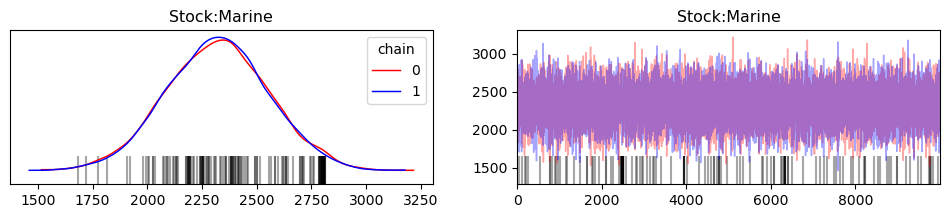

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


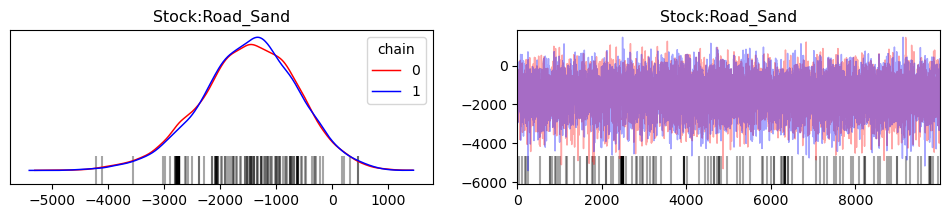

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


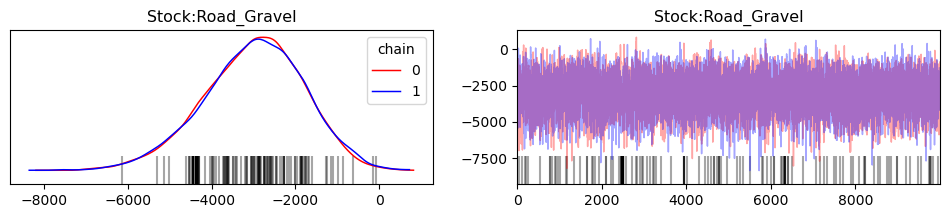

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


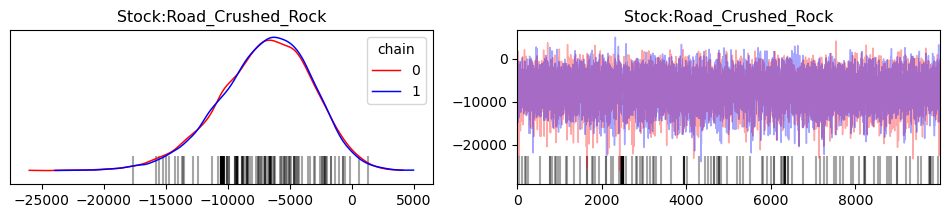

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


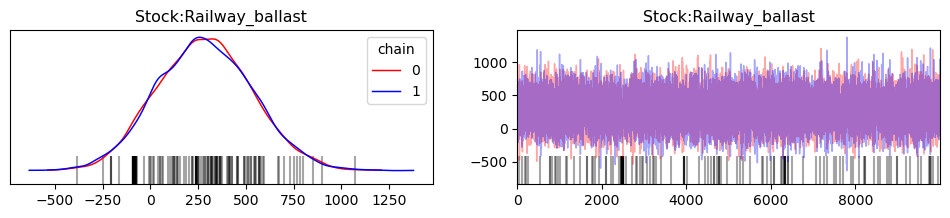

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


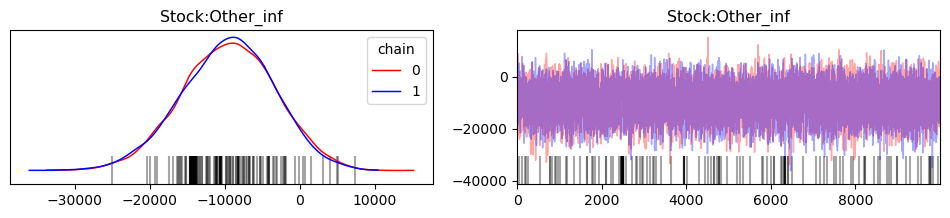

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


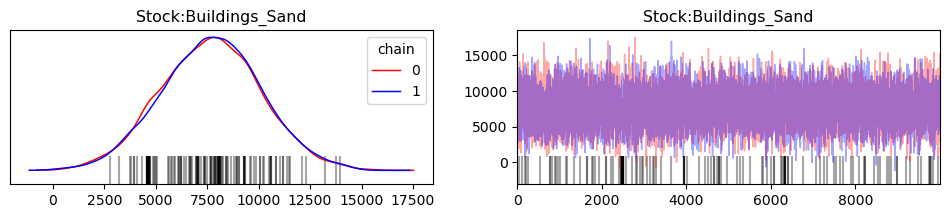

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


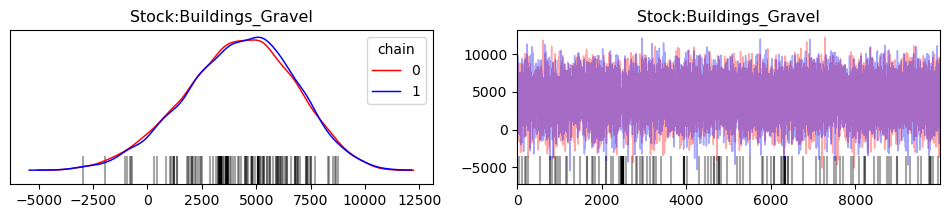

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


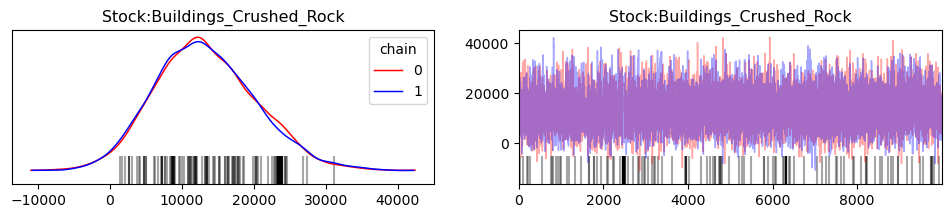

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


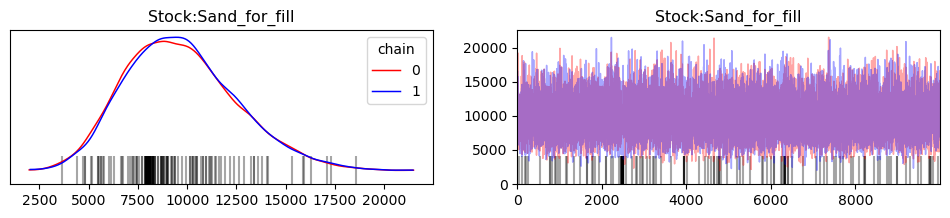

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


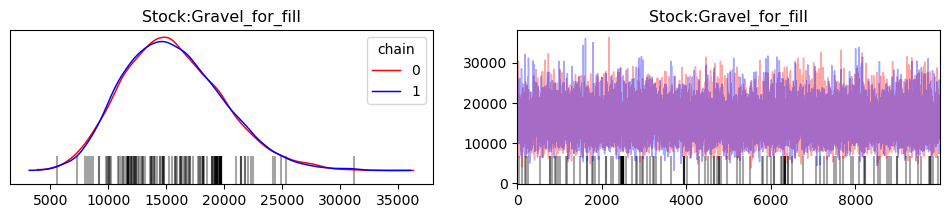

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


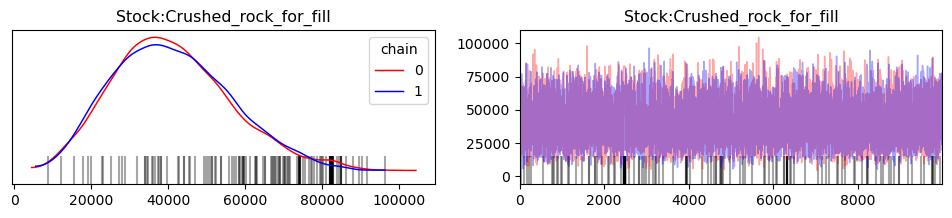

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


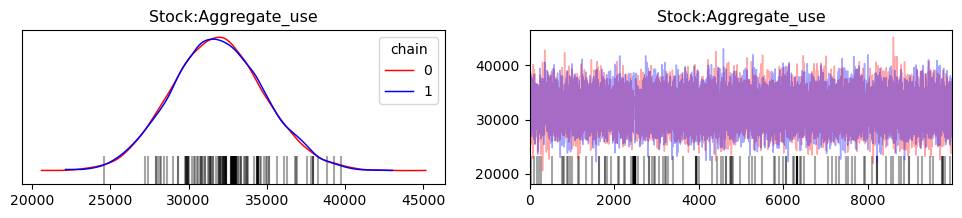

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


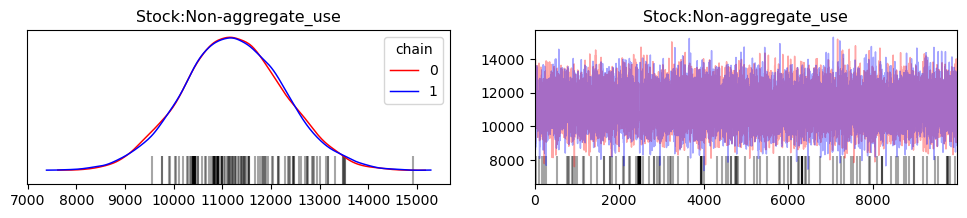

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


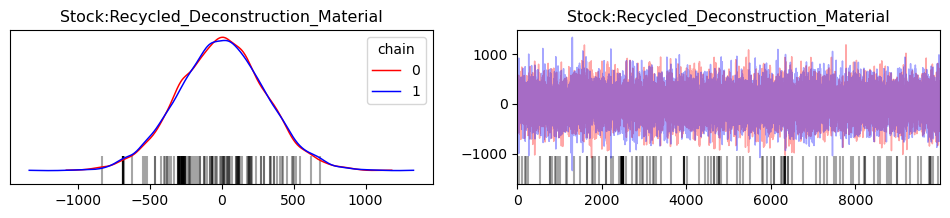

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


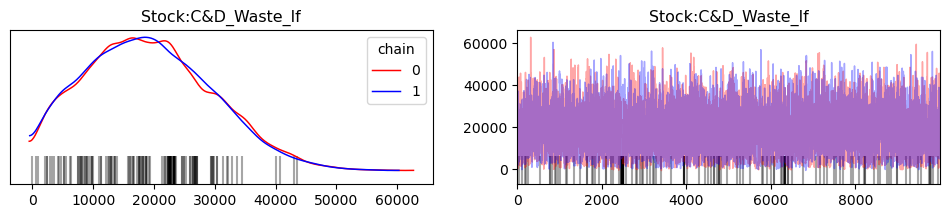

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


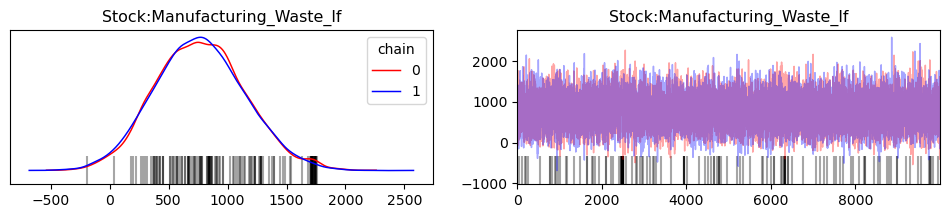

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


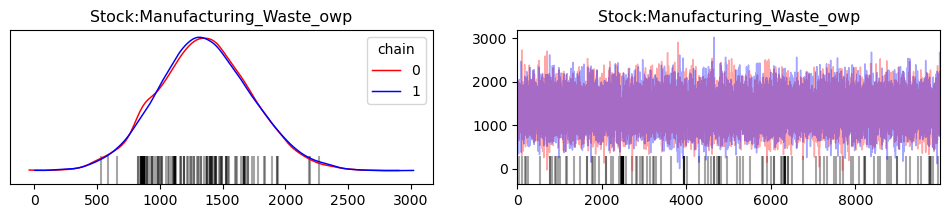

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


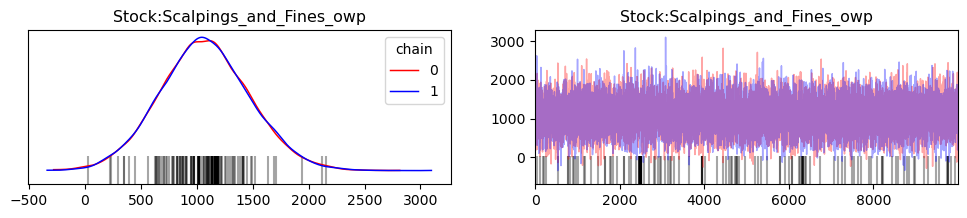

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


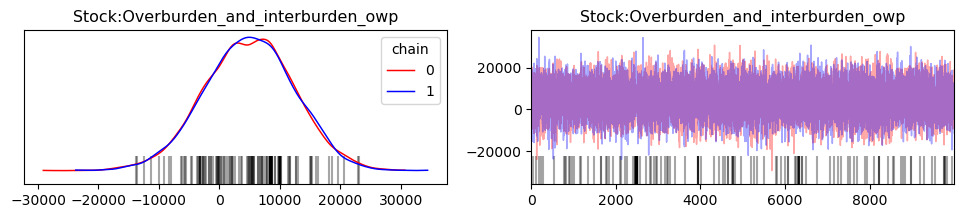

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


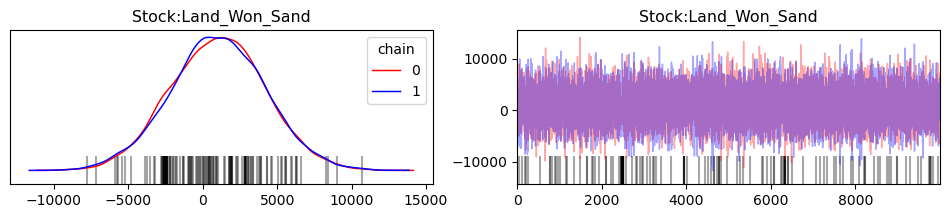

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


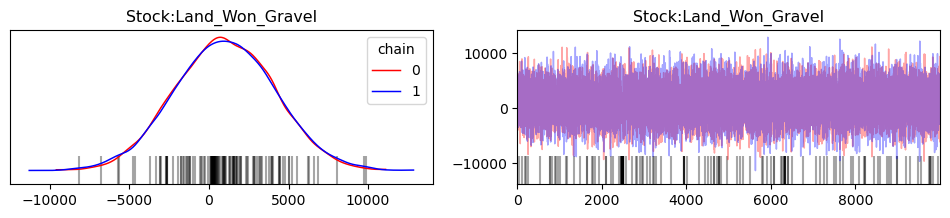

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


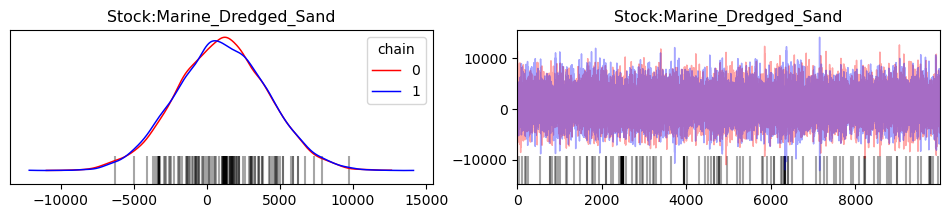

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


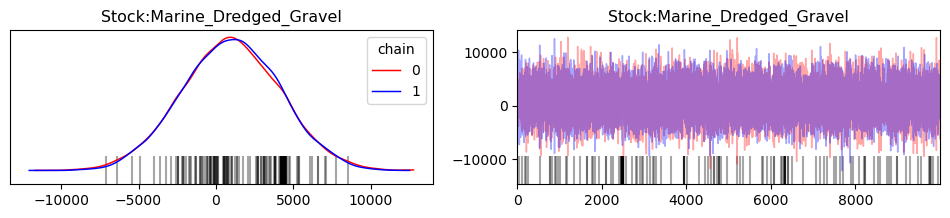

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


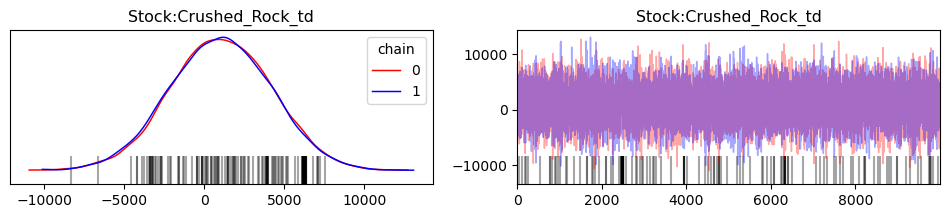

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


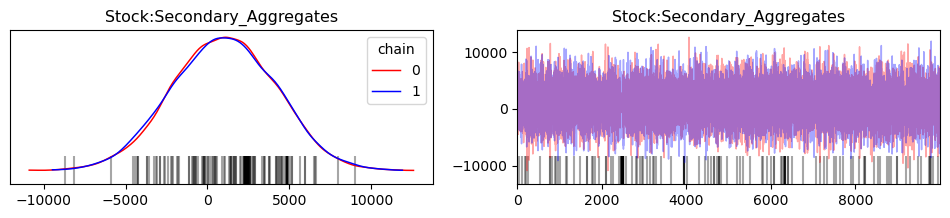

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


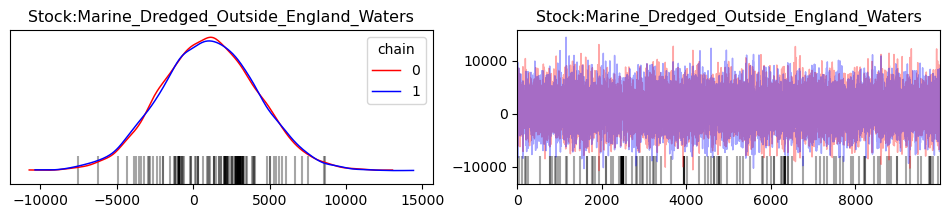

In [6]:
#generate traceplots for the change in stock variables

labels=[processnamesdict[str(x)] for x in availablechildstocks]

import arviz.labels as azl

plt.tight_layout()
for i in range(0,len(labels)):
    
    labeller = azl.MapLabeller(var_name_map={"stocks": r"Stock"+":"+labels[i]})
    
    posteriorstocktraceplots=az.plot_trace(trace, var_names="stocks",compact=True,show=True,backend="matplotlib", coords={'stocks_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorstocktraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Stocktrace"+"_"+labels[i]+filelabeler(useratiodata)+".pdf")

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


<Figure size 640x480 with 0 Axes>

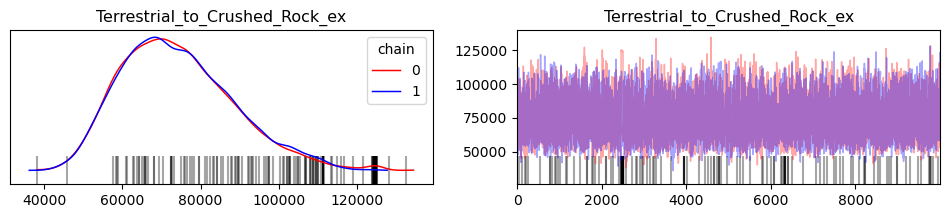

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


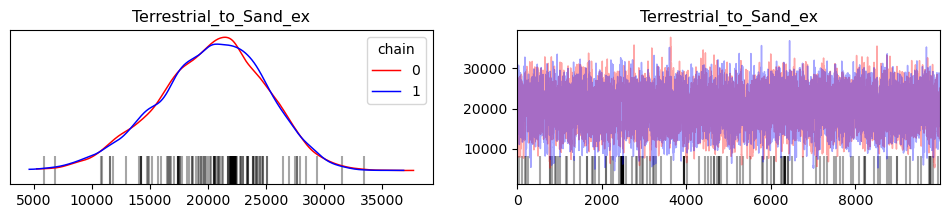

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


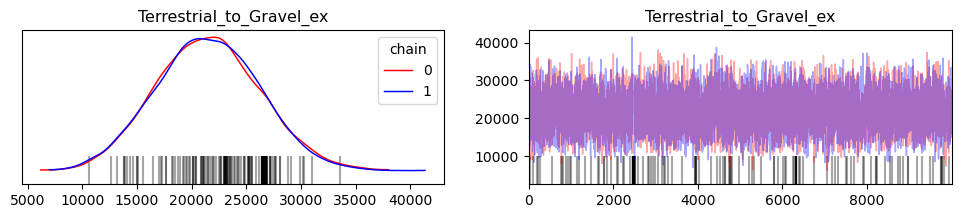

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


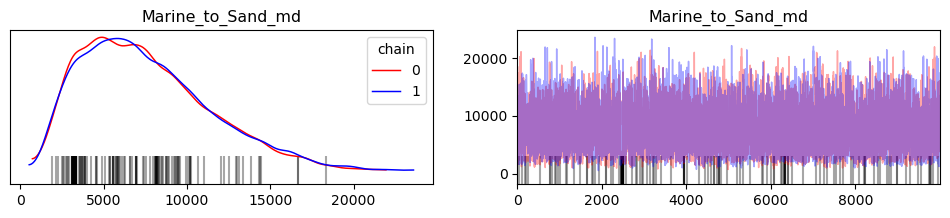

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


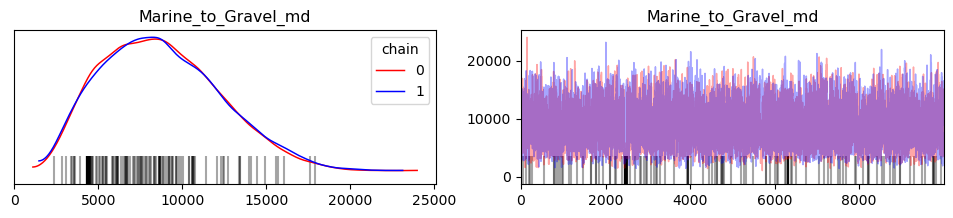

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


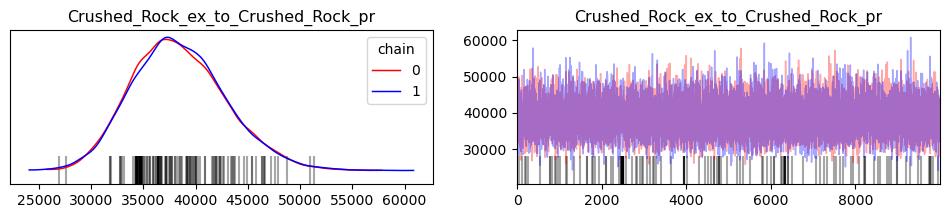

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


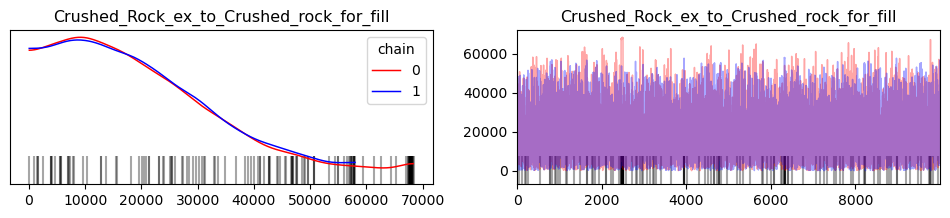

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


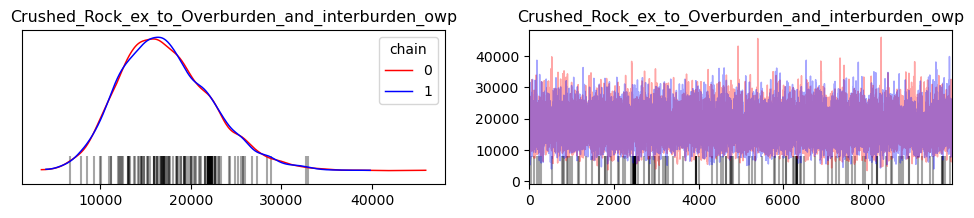

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


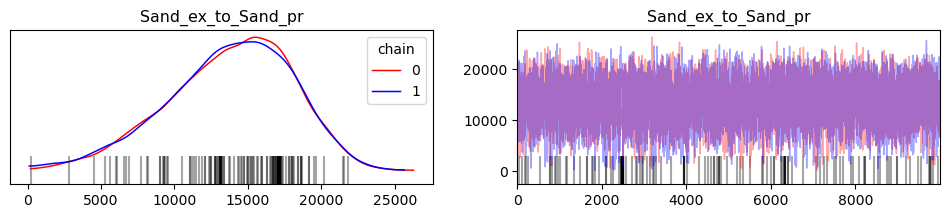

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


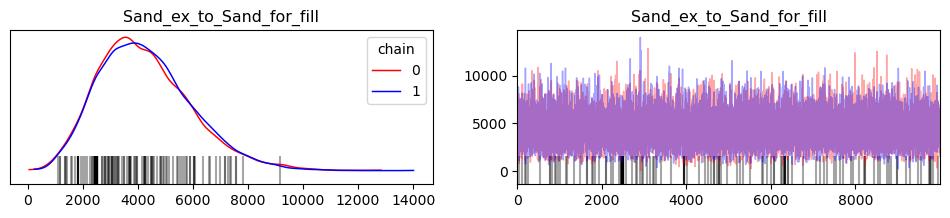

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


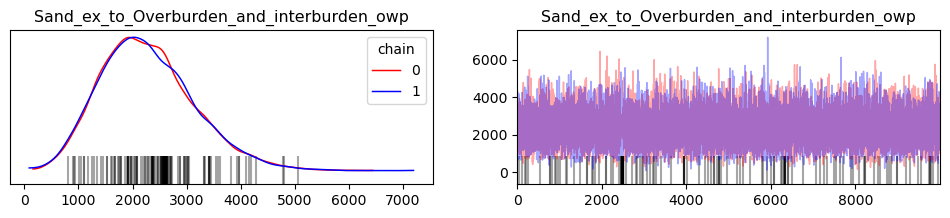

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


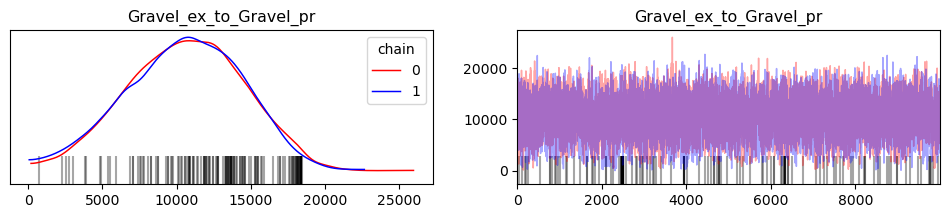

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


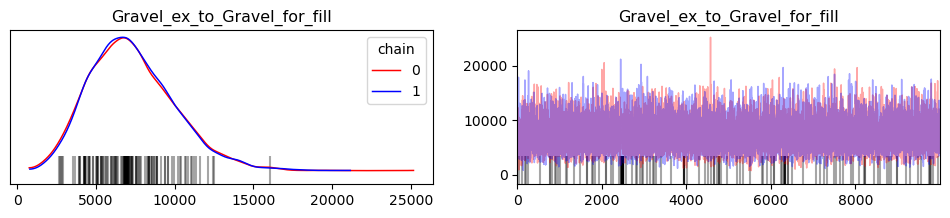

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


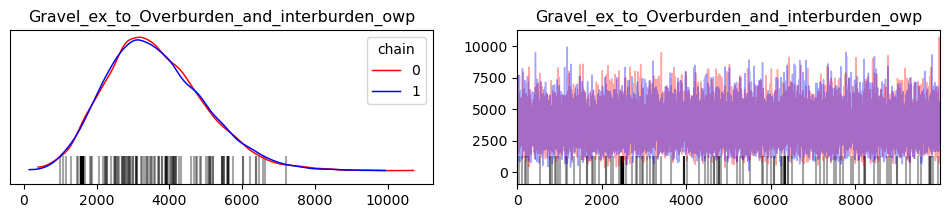

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


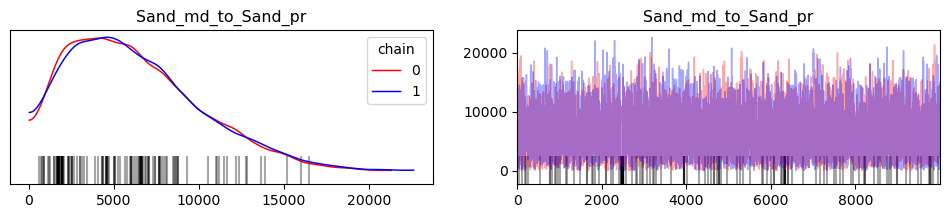

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


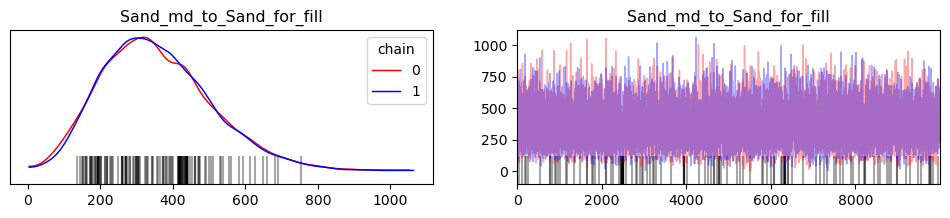

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


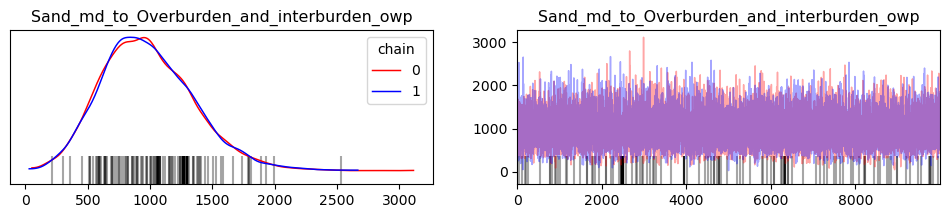

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


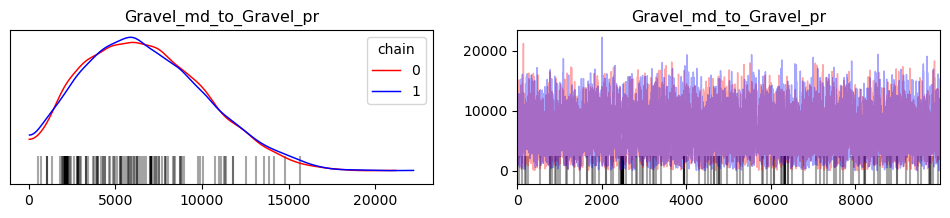

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


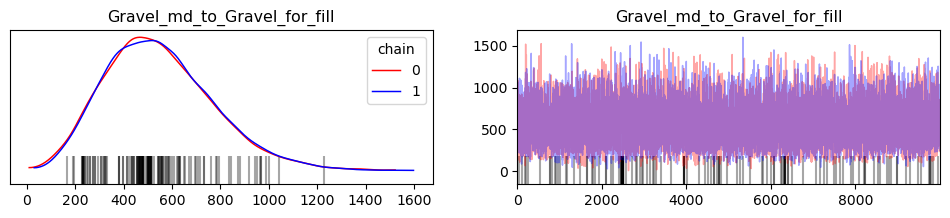

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


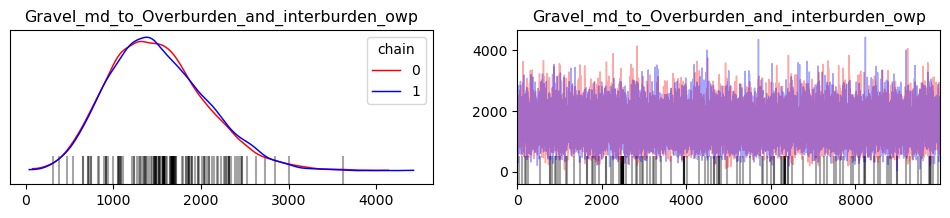

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


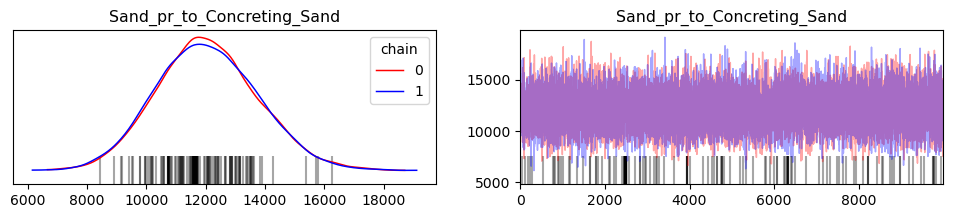

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


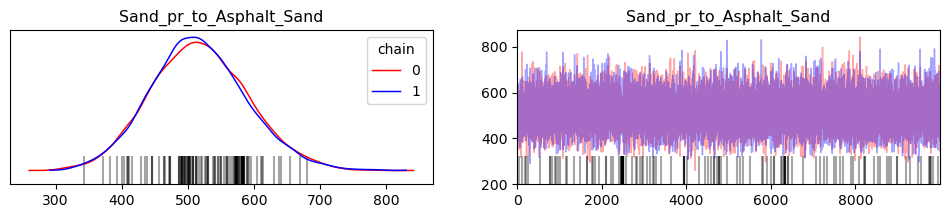

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


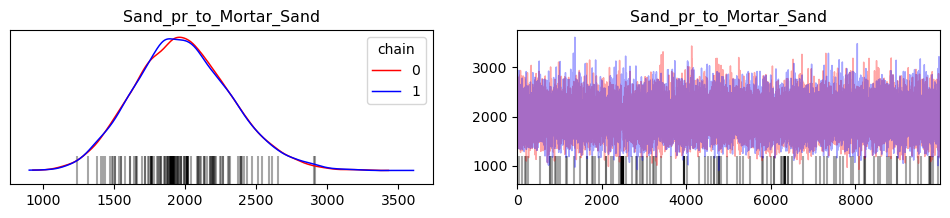

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


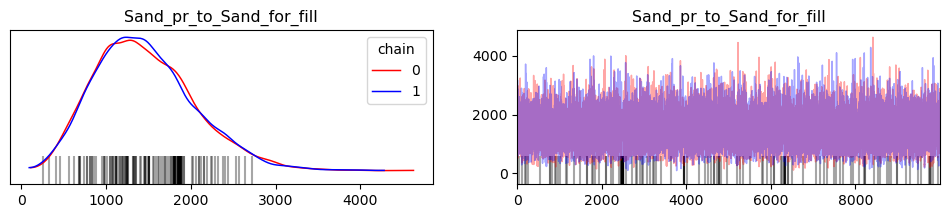

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


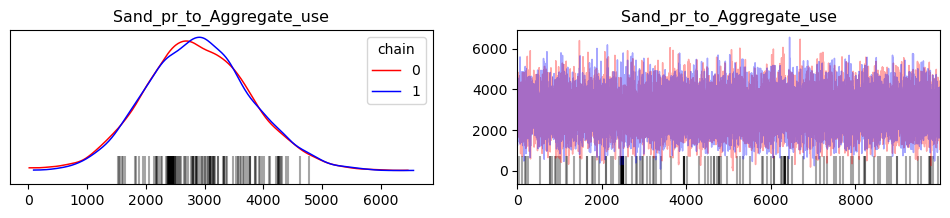

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


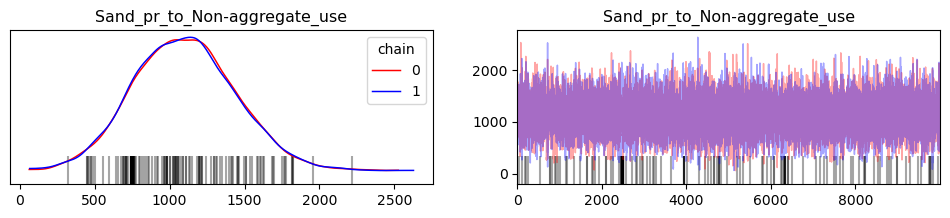

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


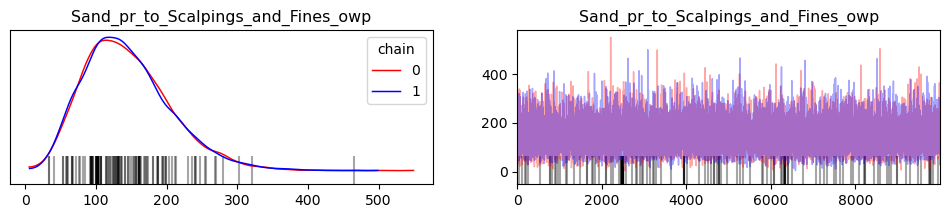

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


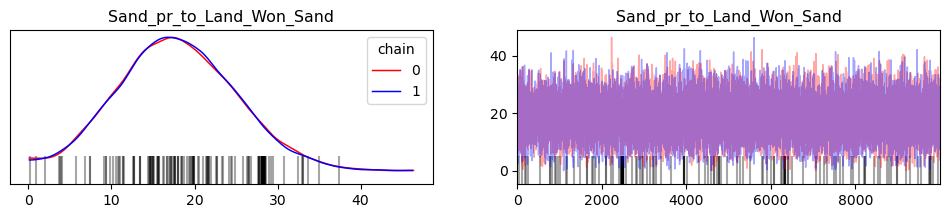

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


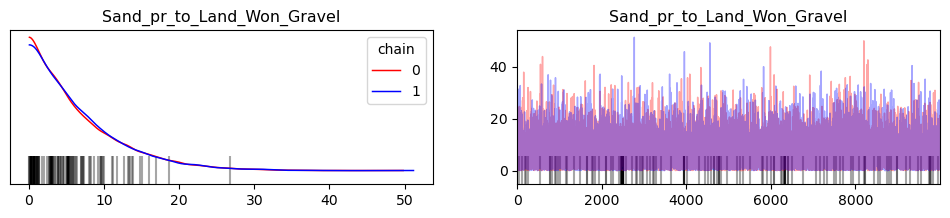

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


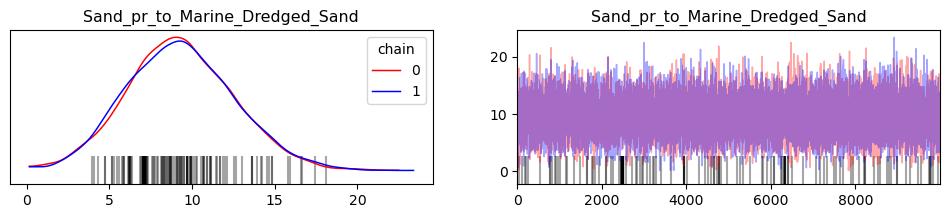

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


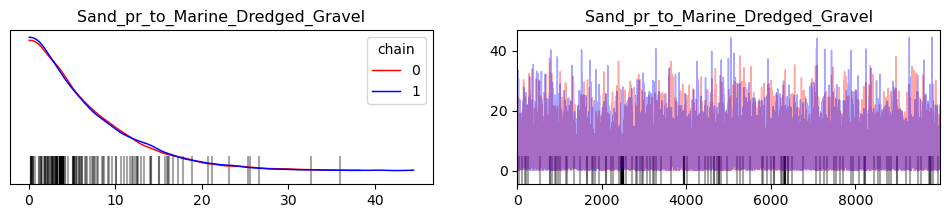

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


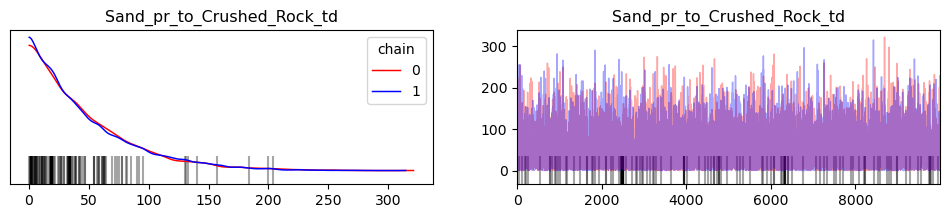

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


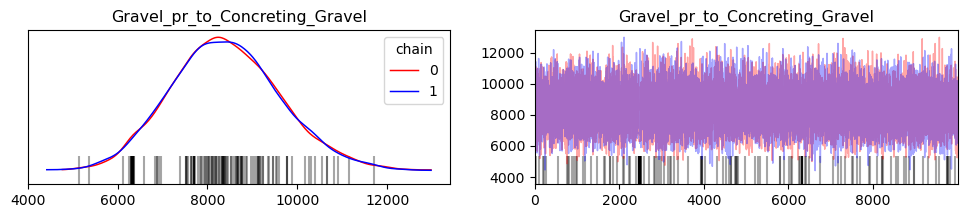

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


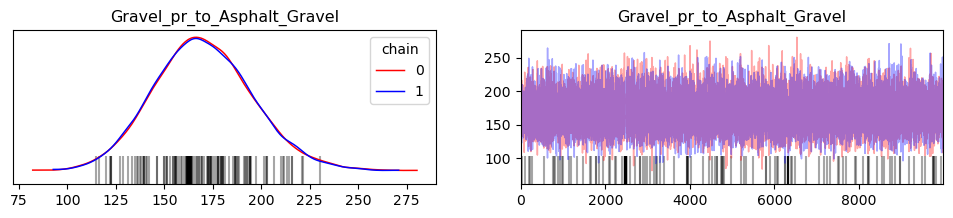

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


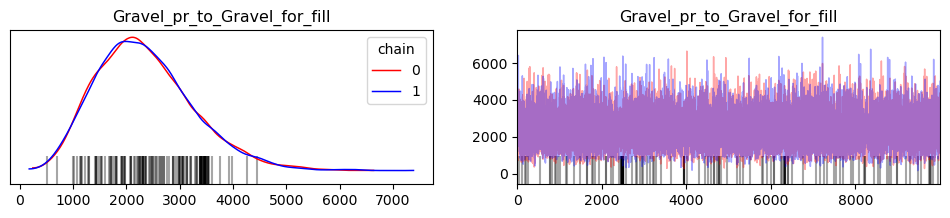

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


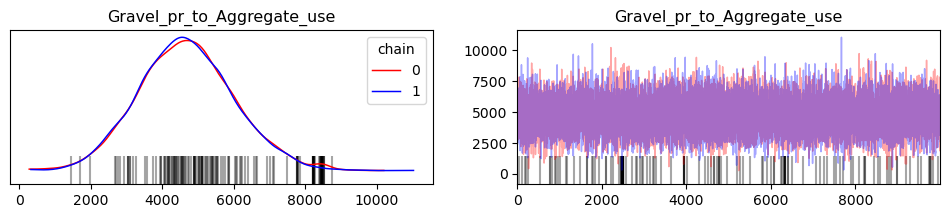

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


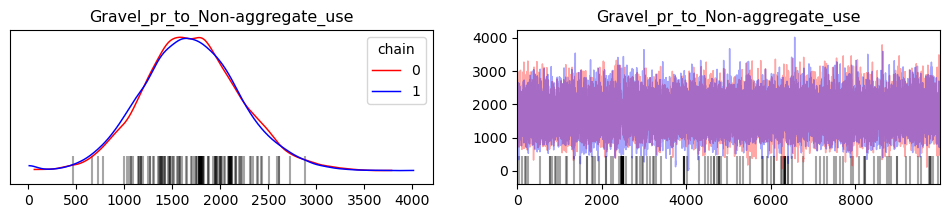

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


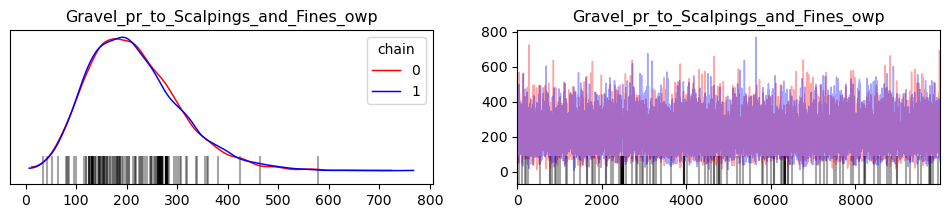

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


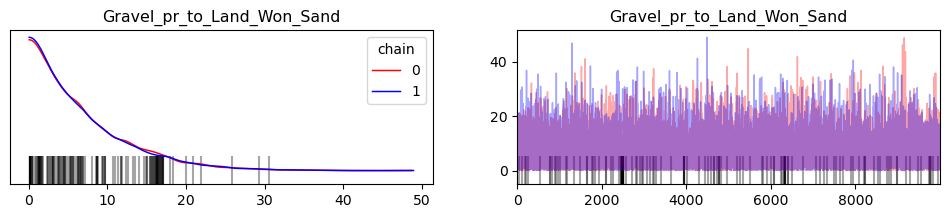

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


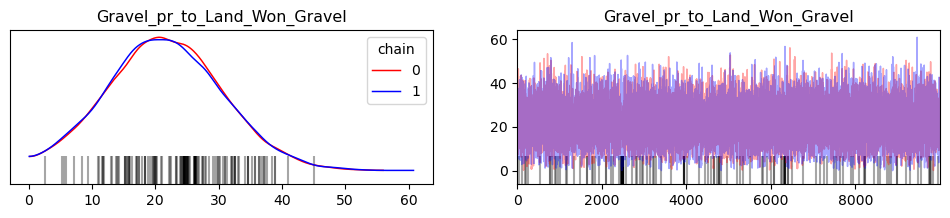

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


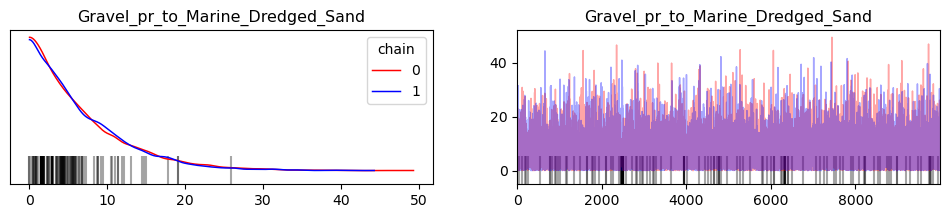

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


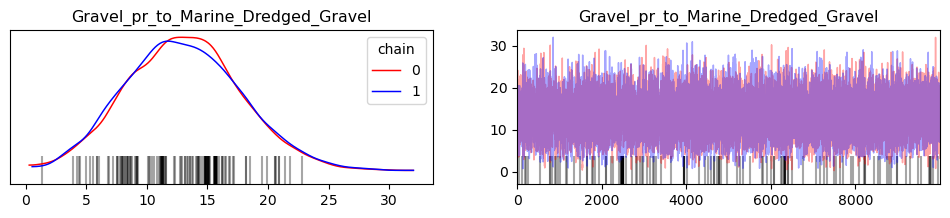

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


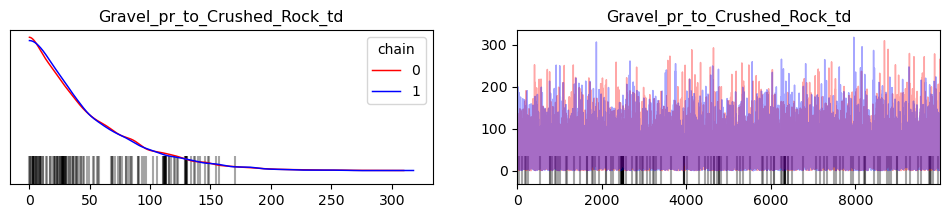

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


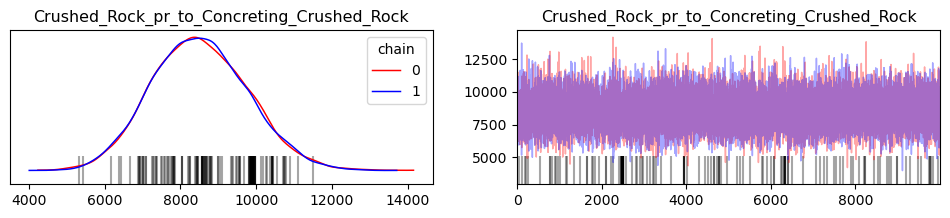

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


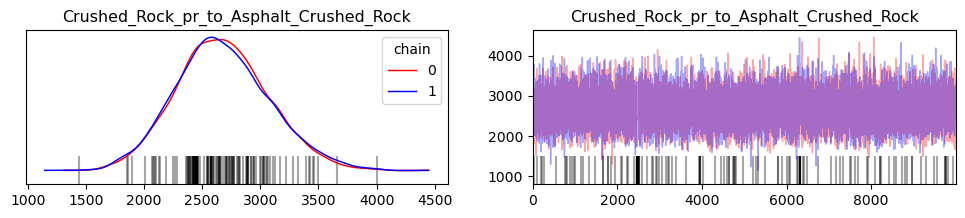

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


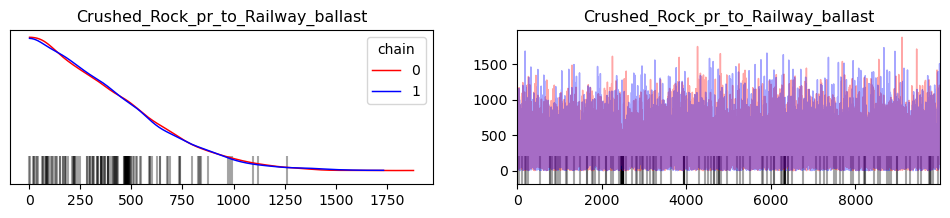

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


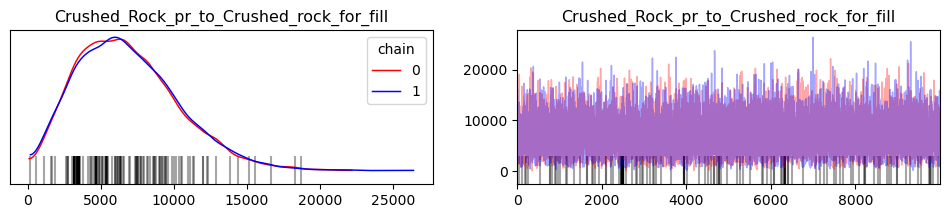

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


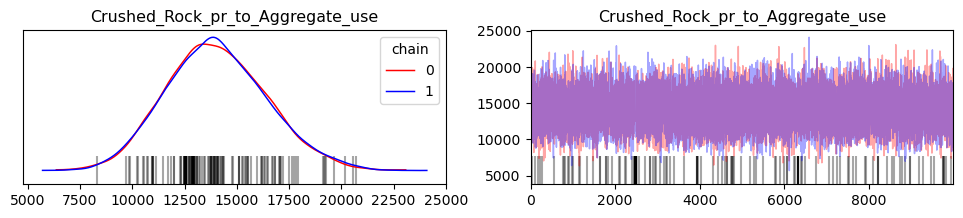

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


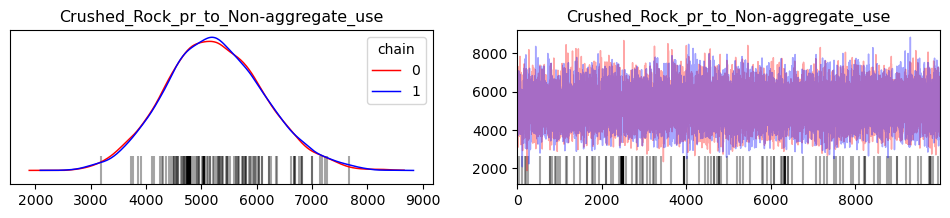

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


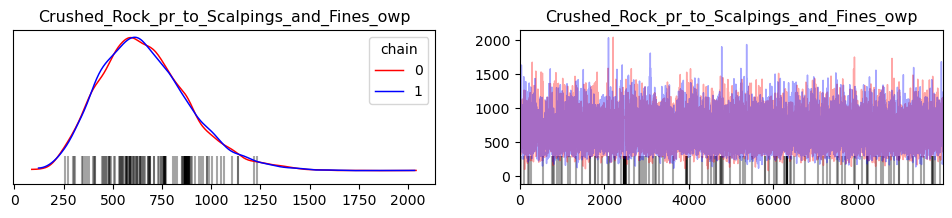

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


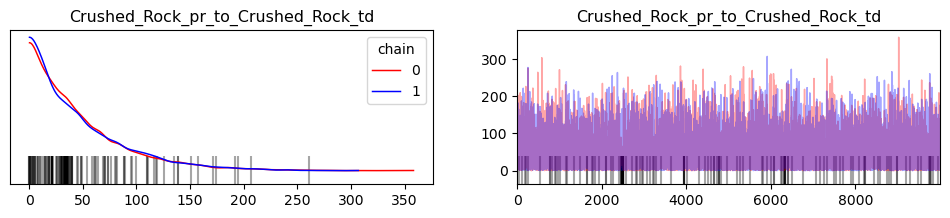

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


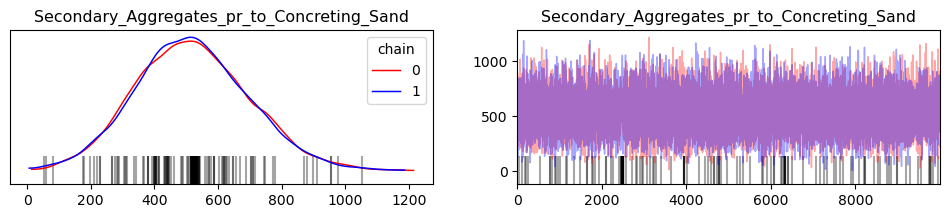

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


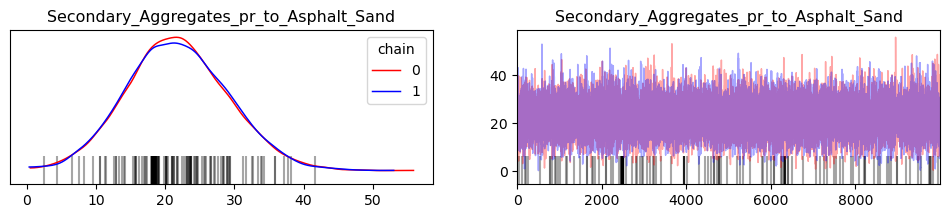

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


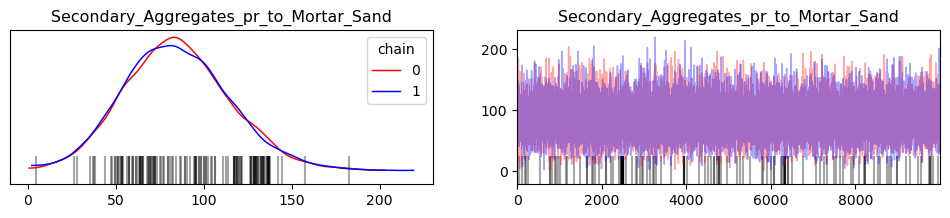

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


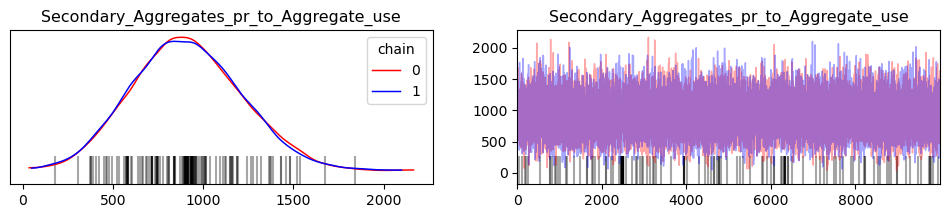

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


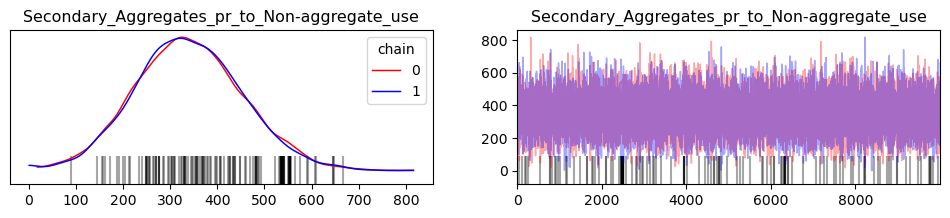

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


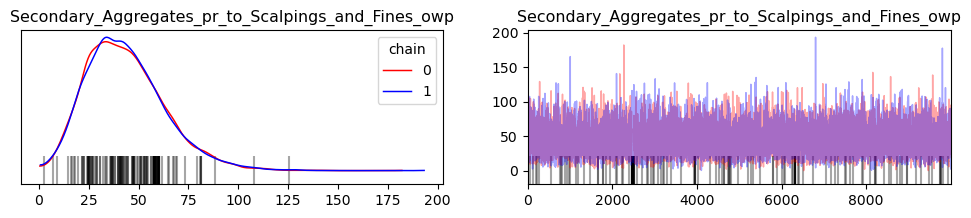

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


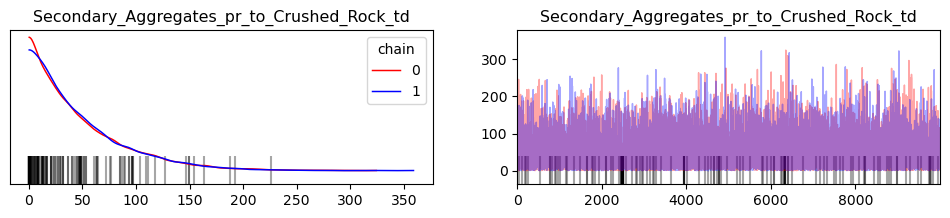

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


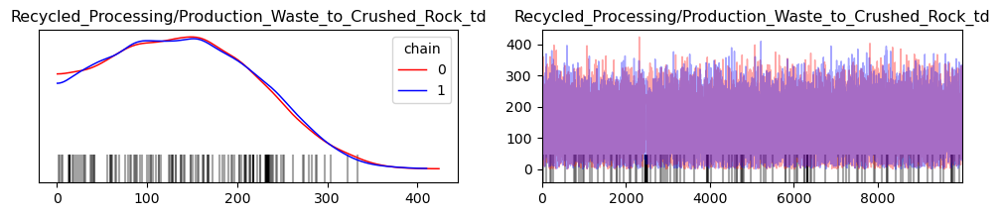

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


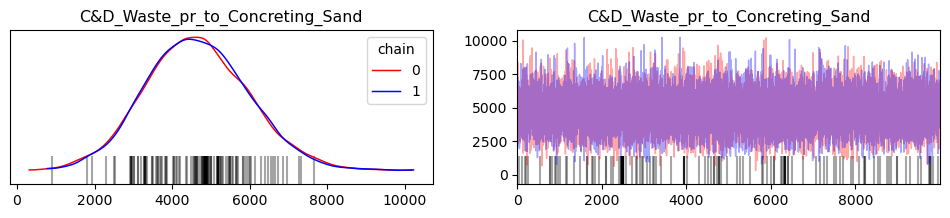

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


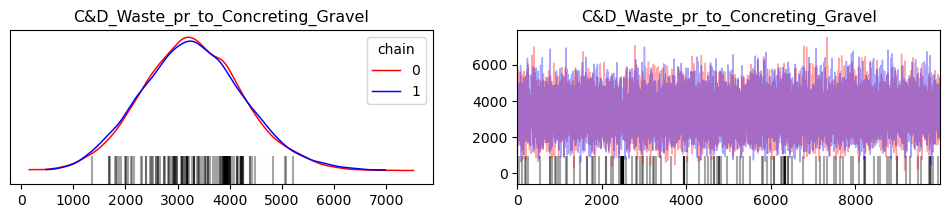

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


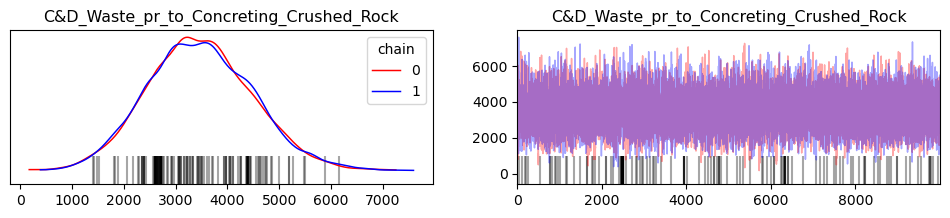

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


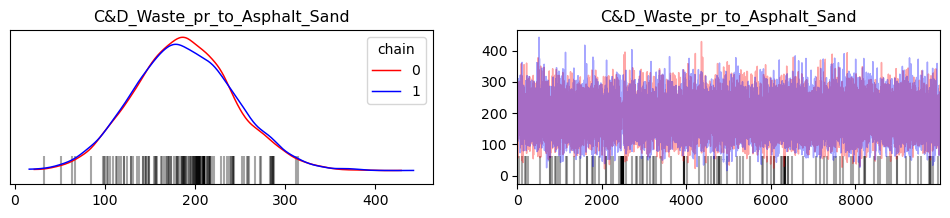

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


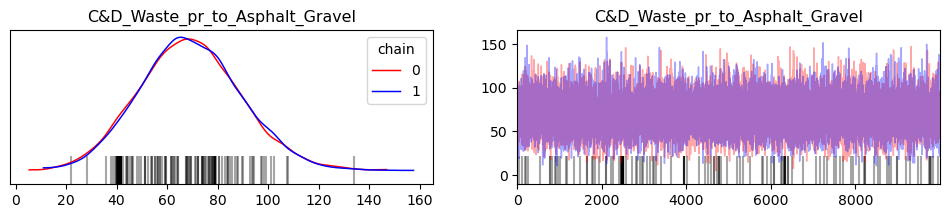

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


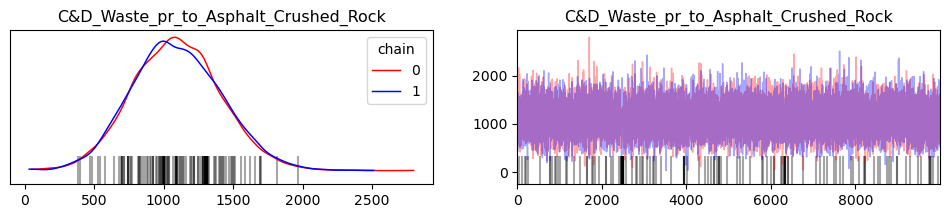

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


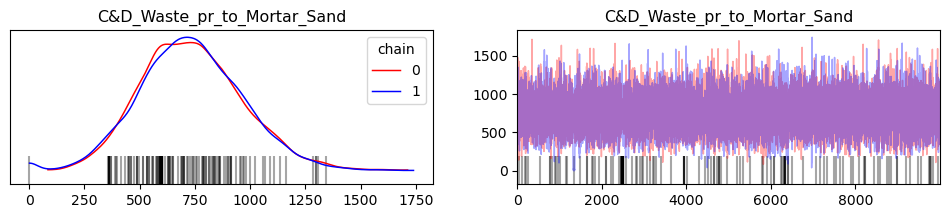

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


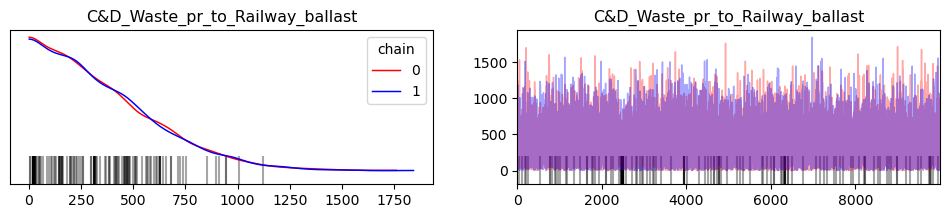

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


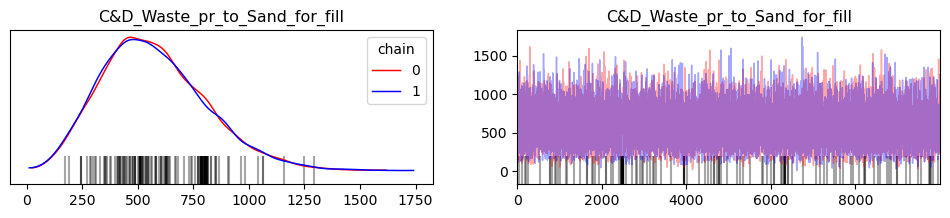

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


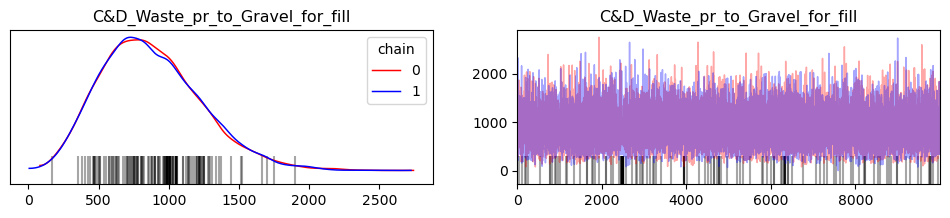

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


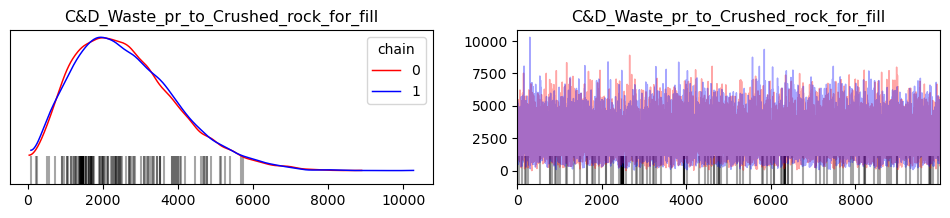

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


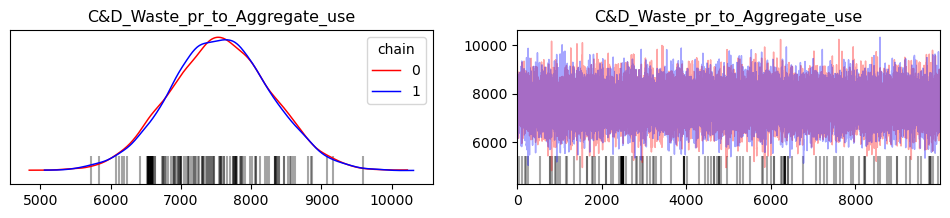

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


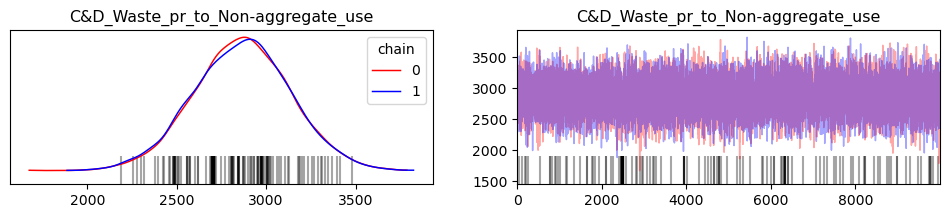

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


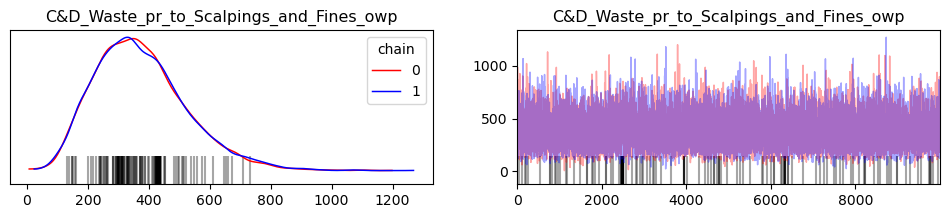

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


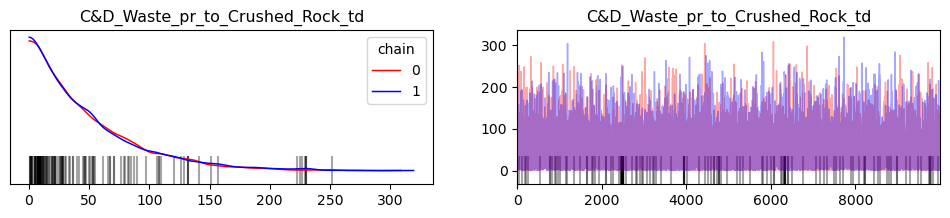

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


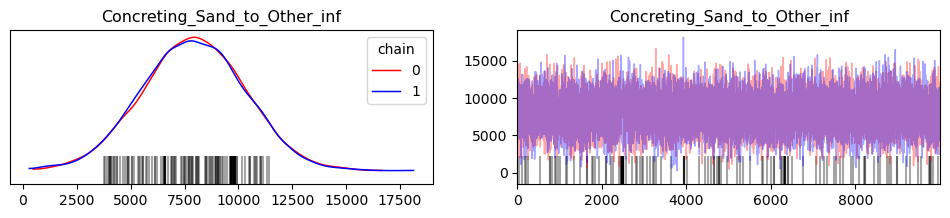

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


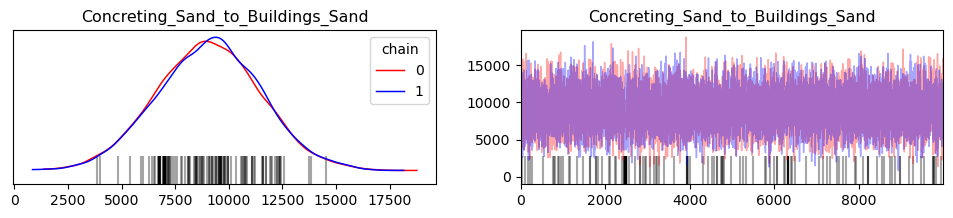

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


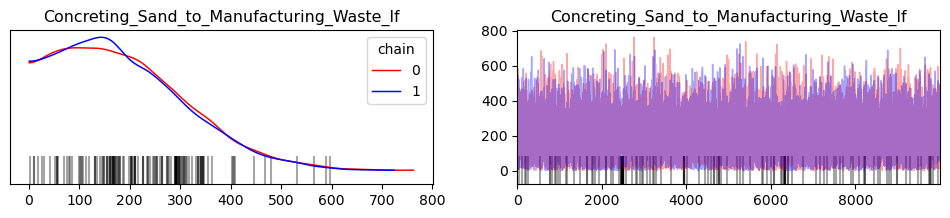

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


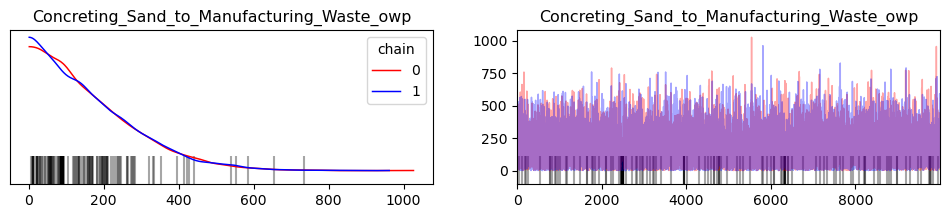

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


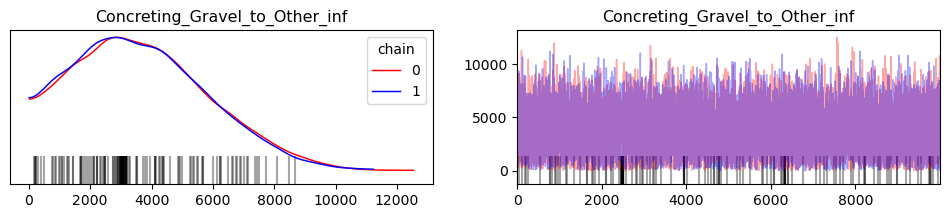

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


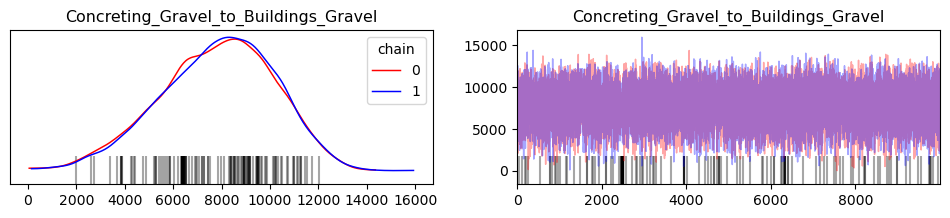

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


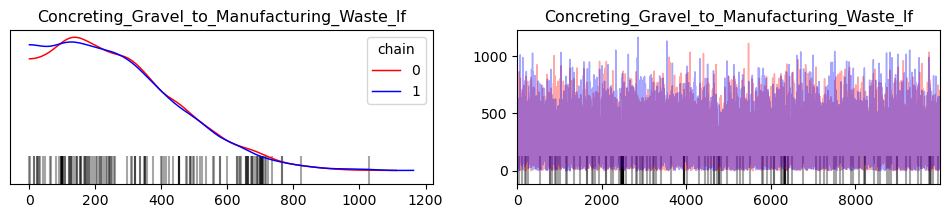

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


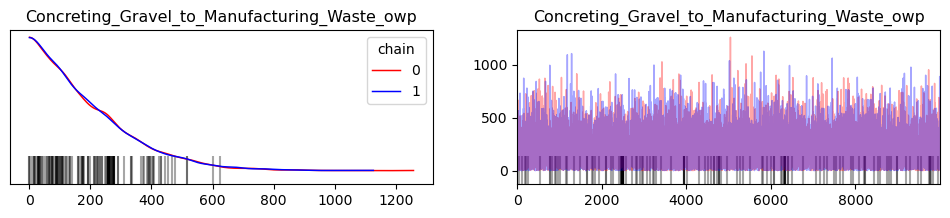

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


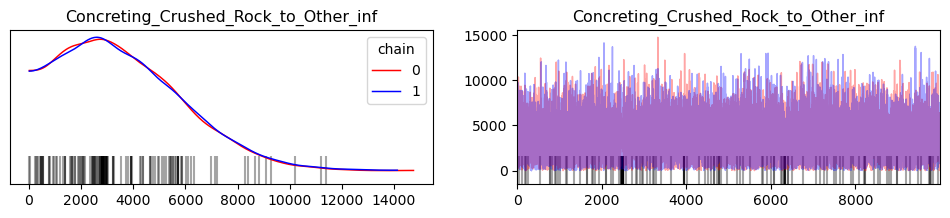

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


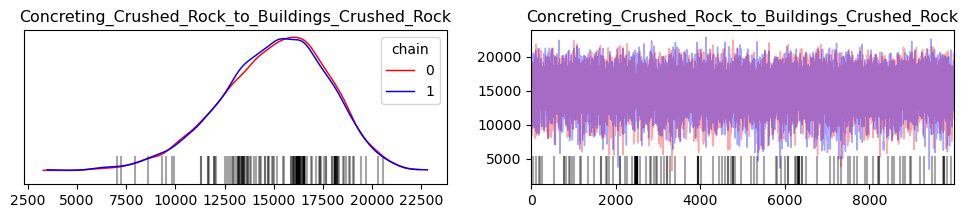

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


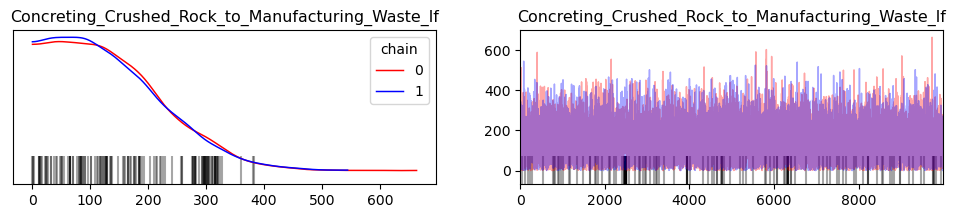

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


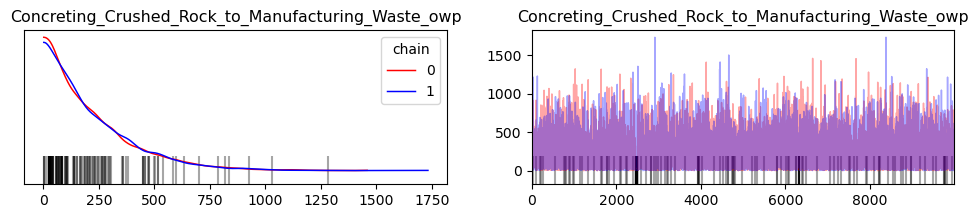

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


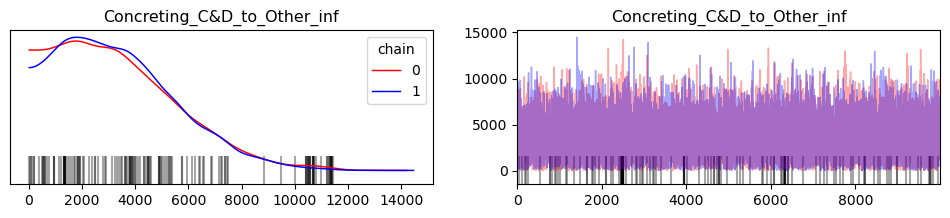

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


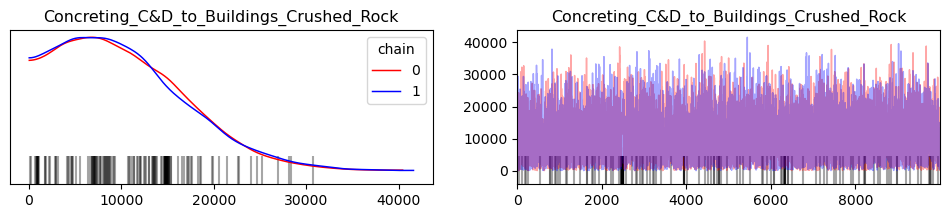

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


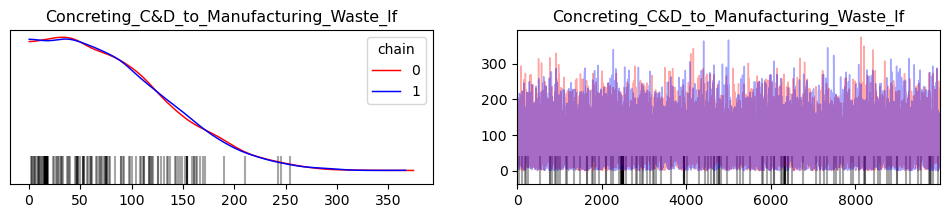

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


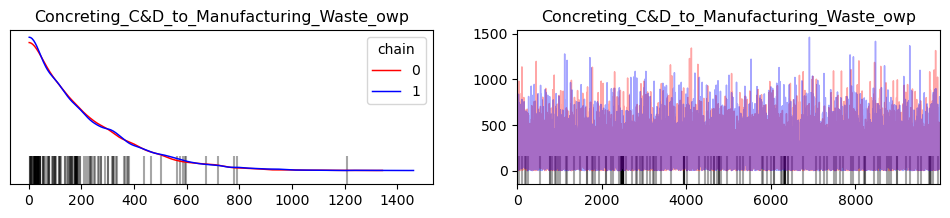

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


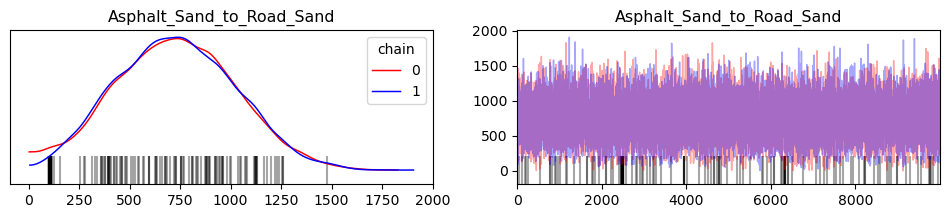

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


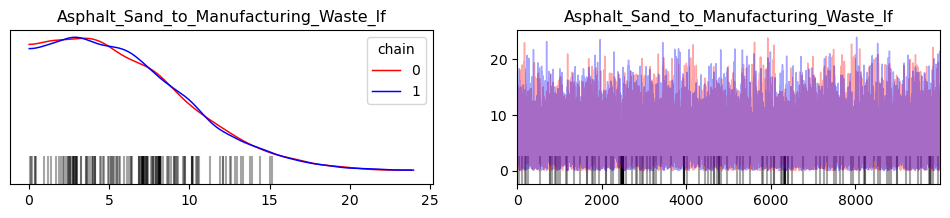

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


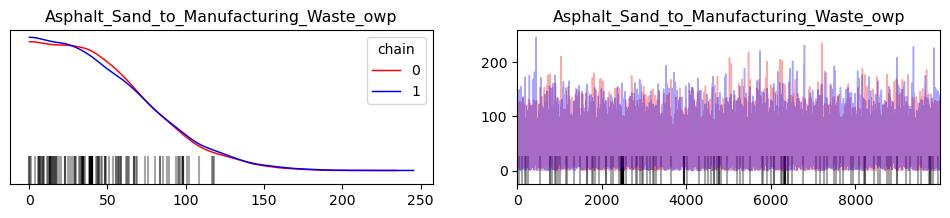

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


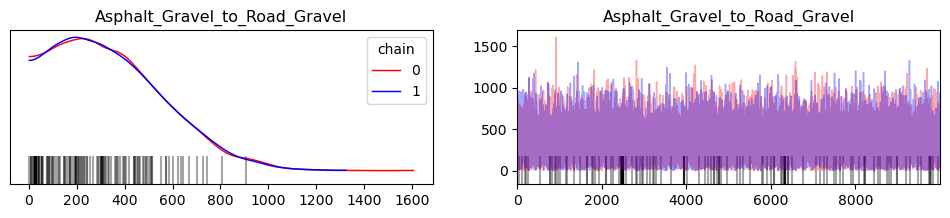

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


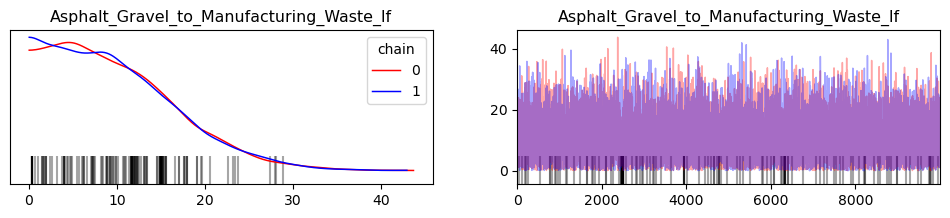

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


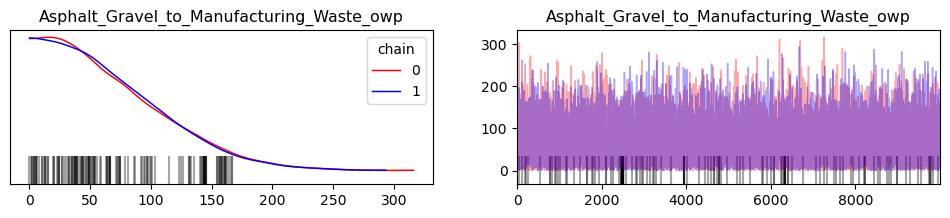

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


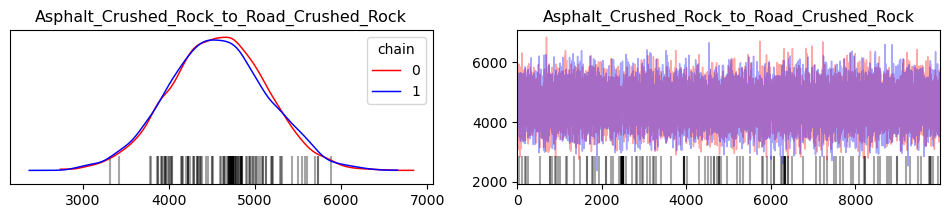

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


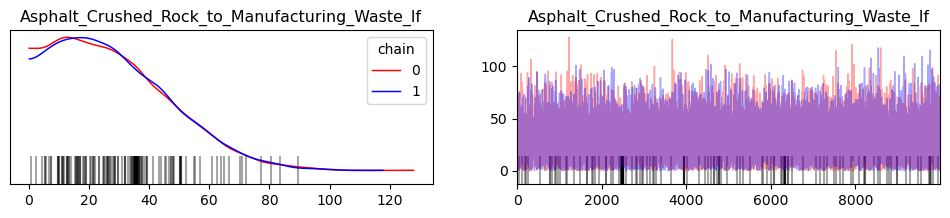

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


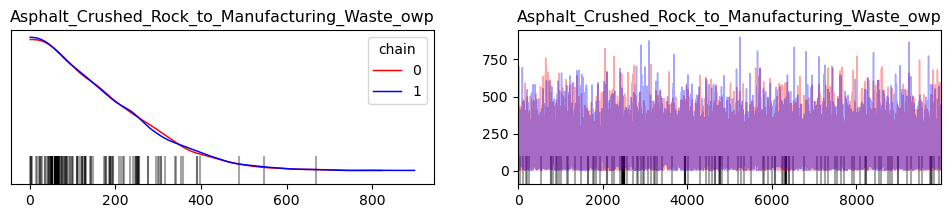

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


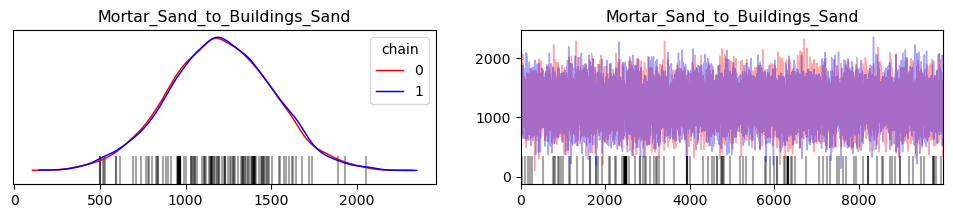

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


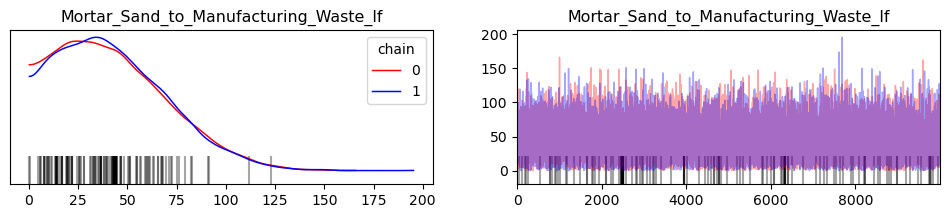

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


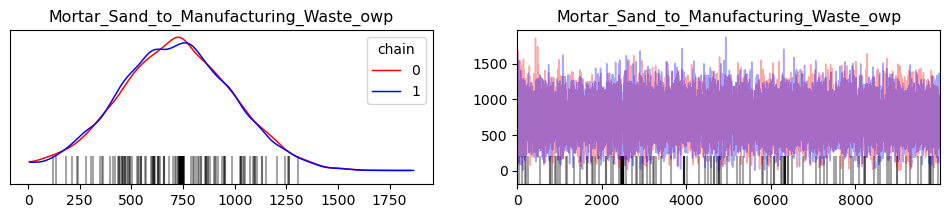

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


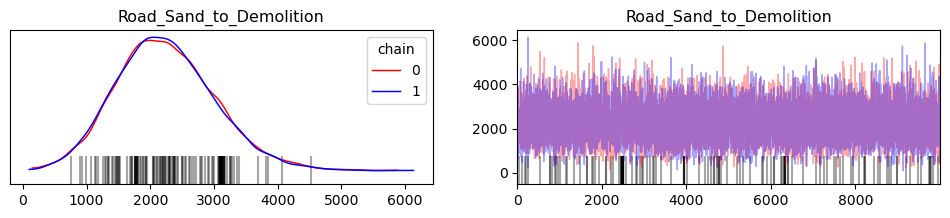

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


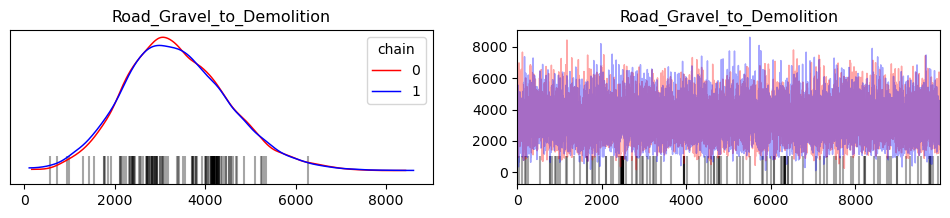

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


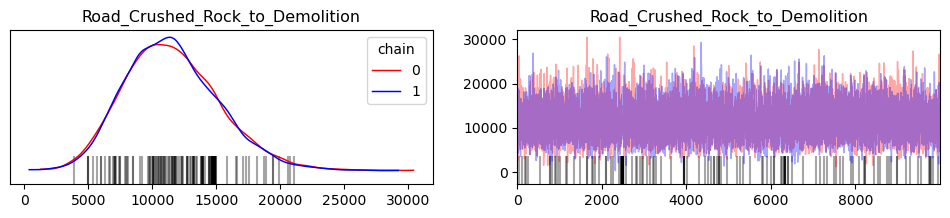

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


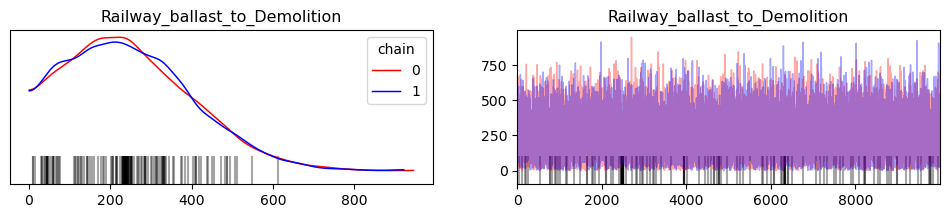

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


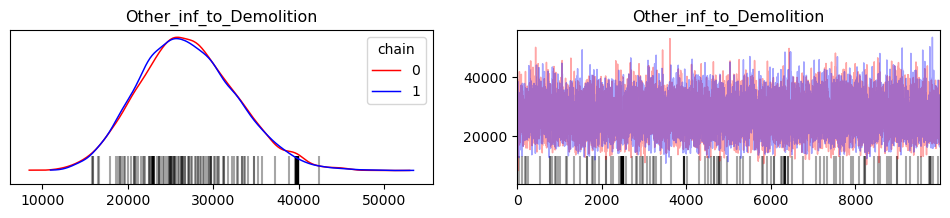

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


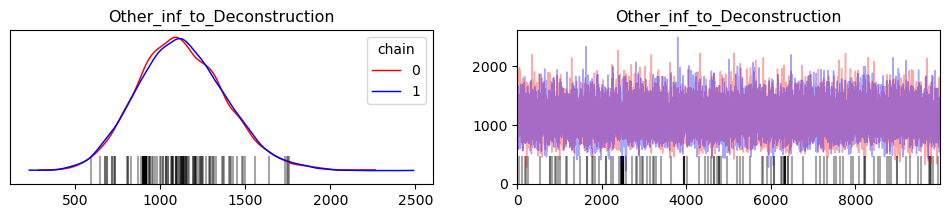

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


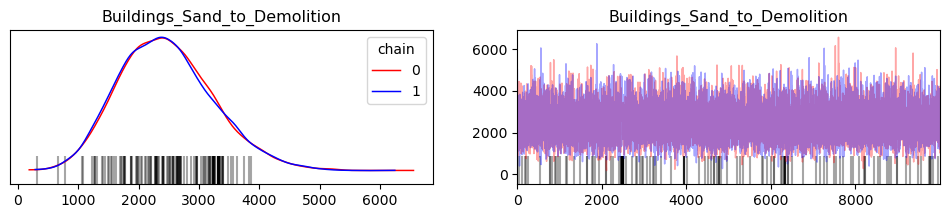

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


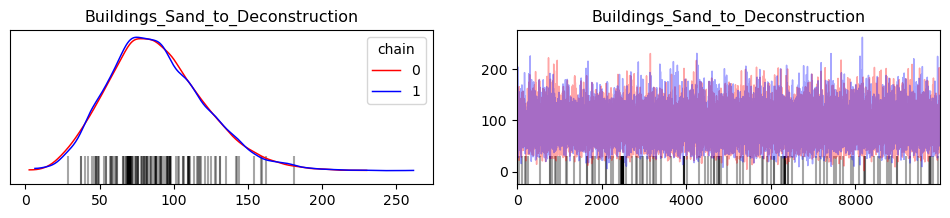

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


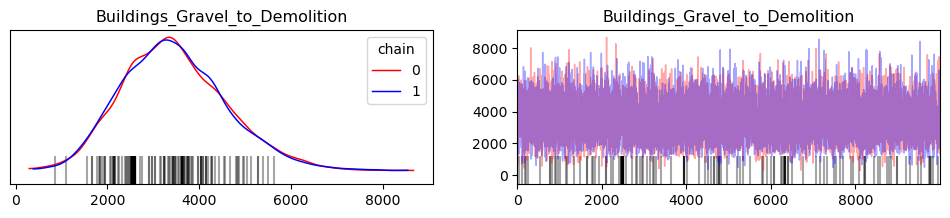

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


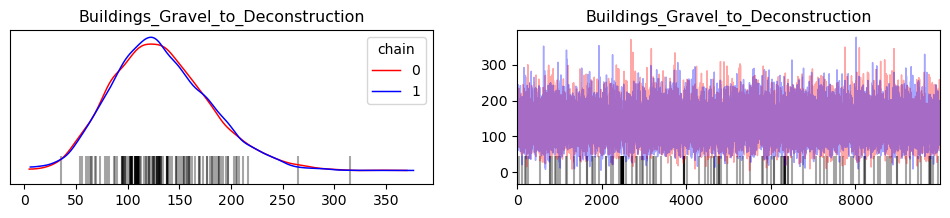

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


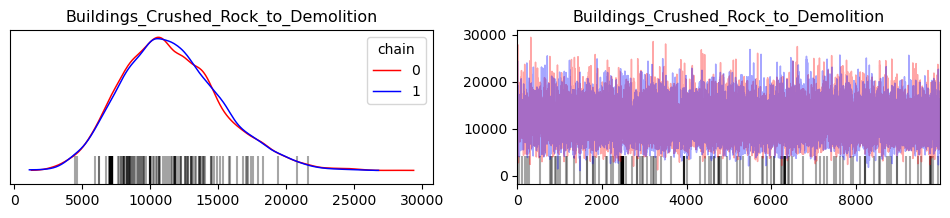

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


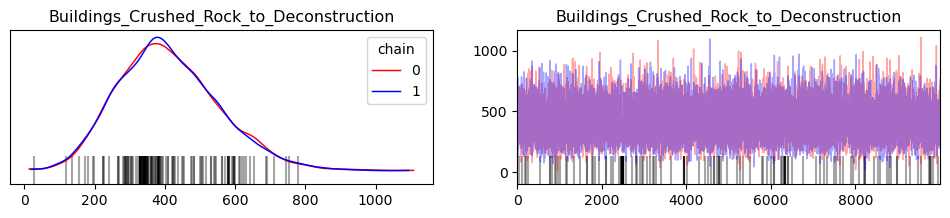

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


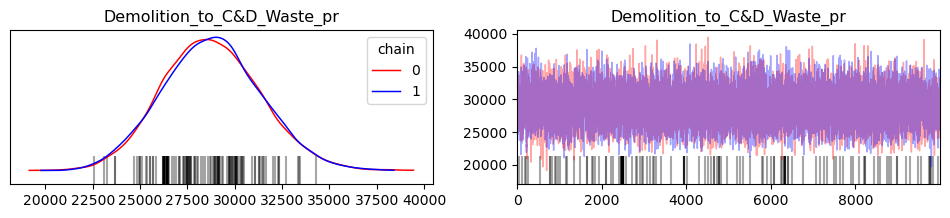

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


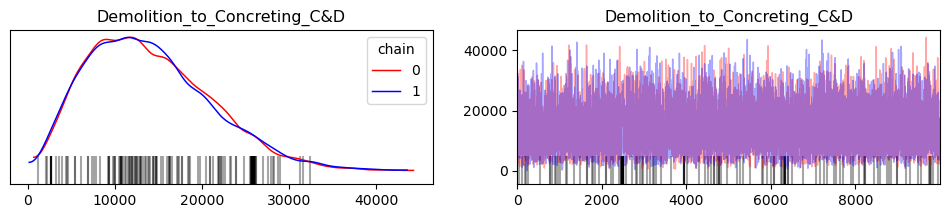

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


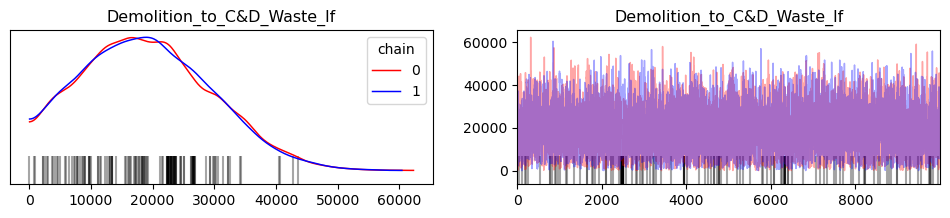

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


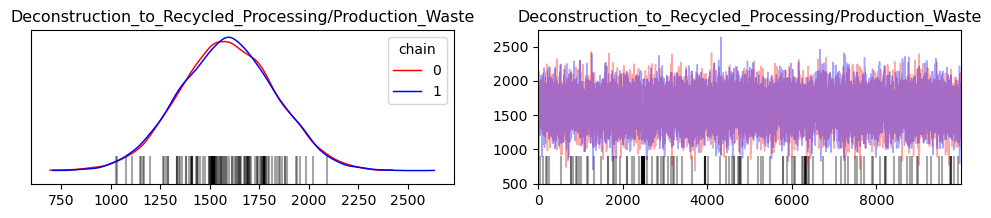

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


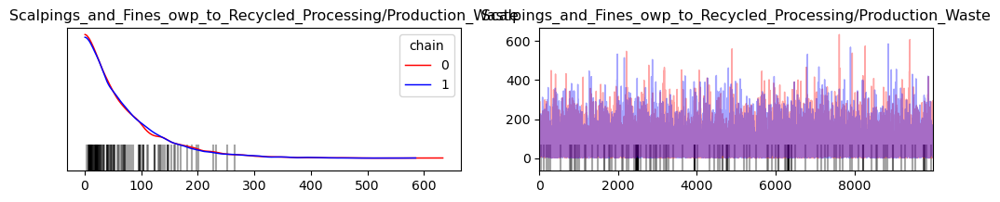

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


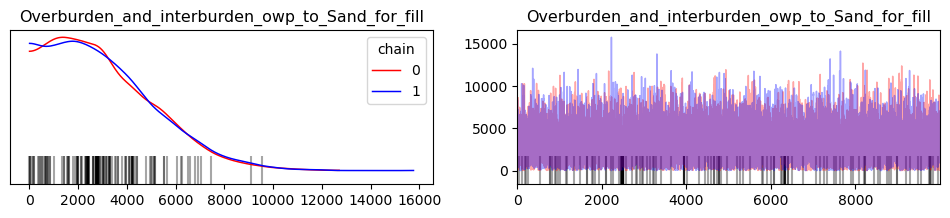

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


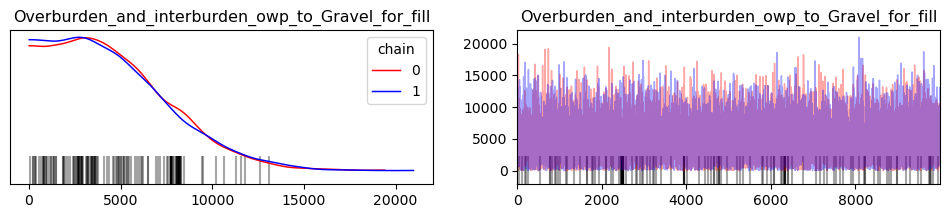

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


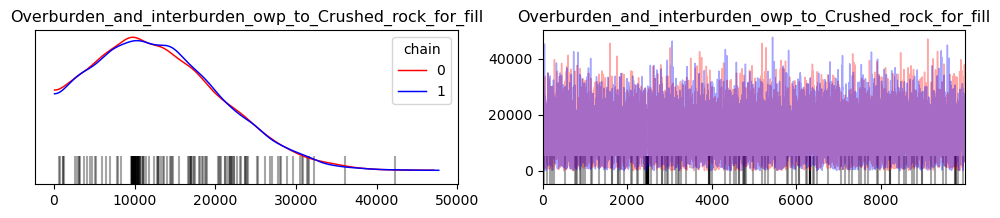

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


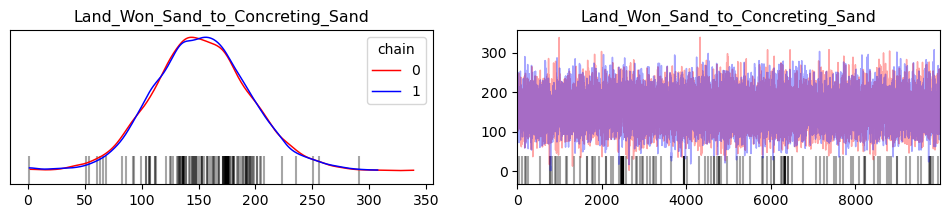

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


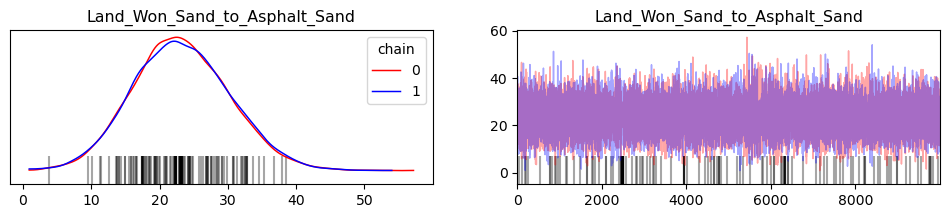

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


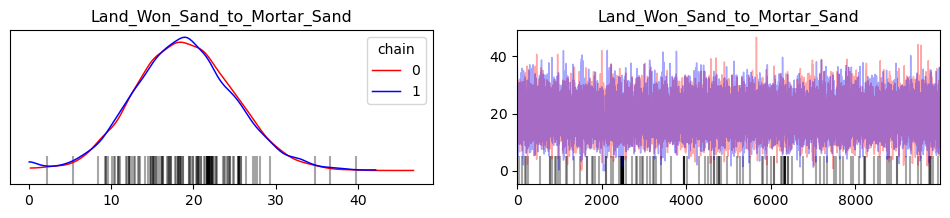

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


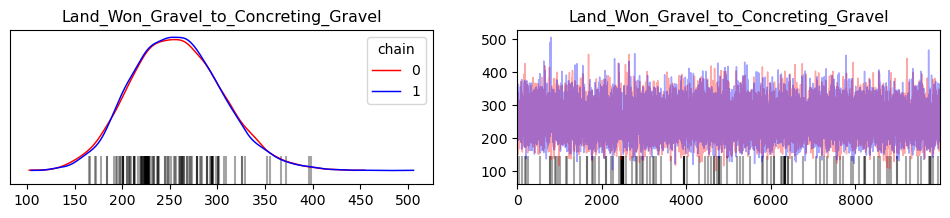

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


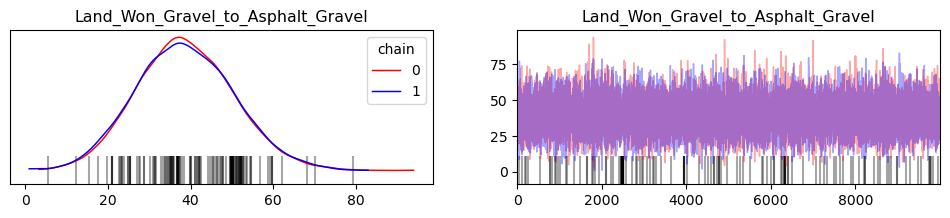

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


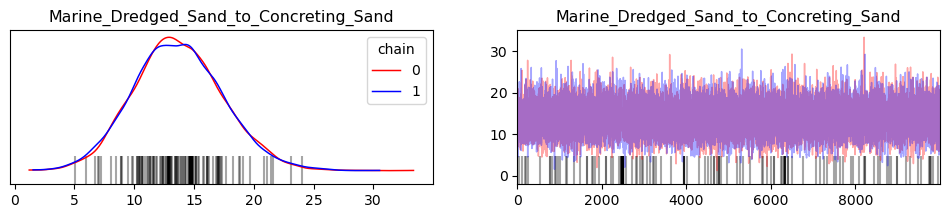

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


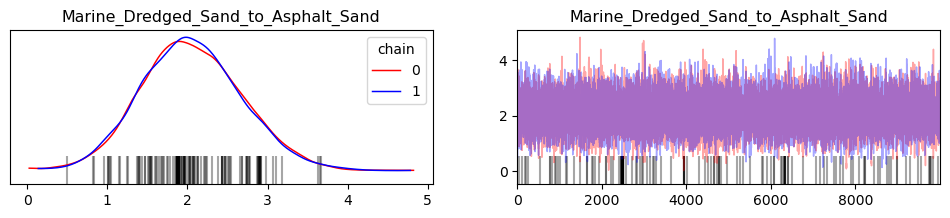

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


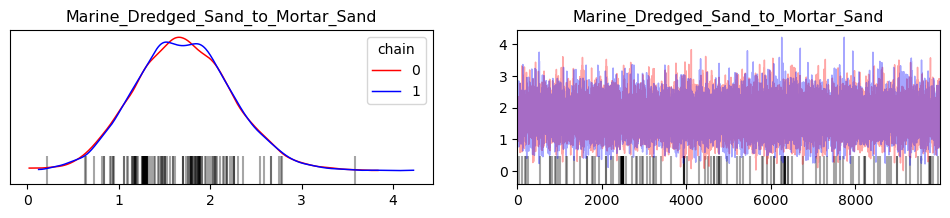

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


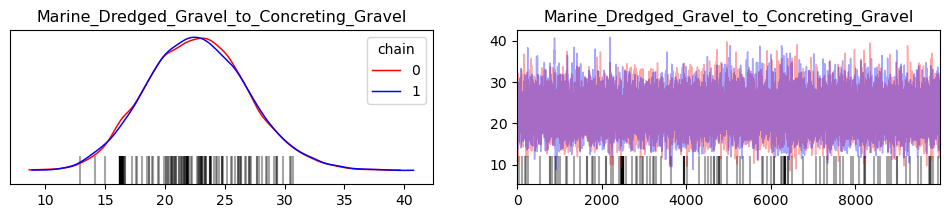

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


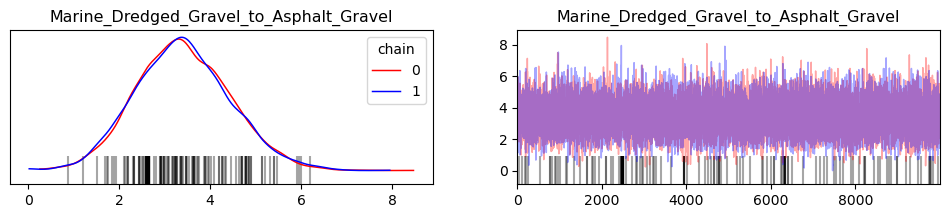

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


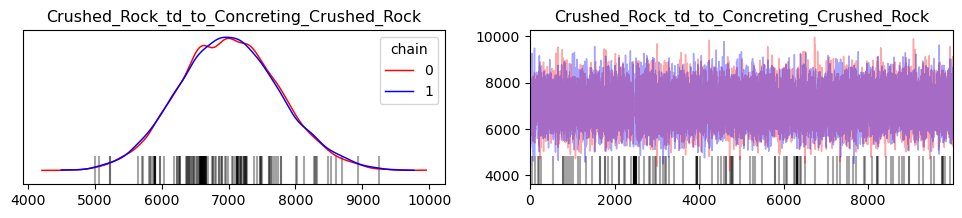

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


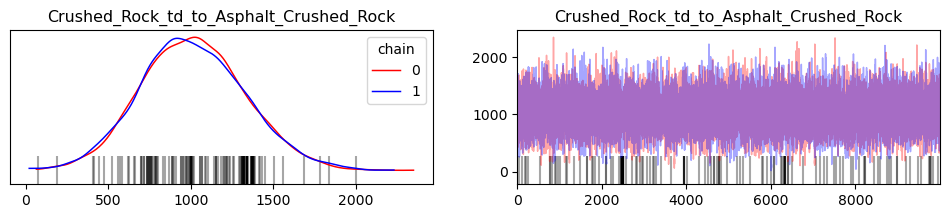

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


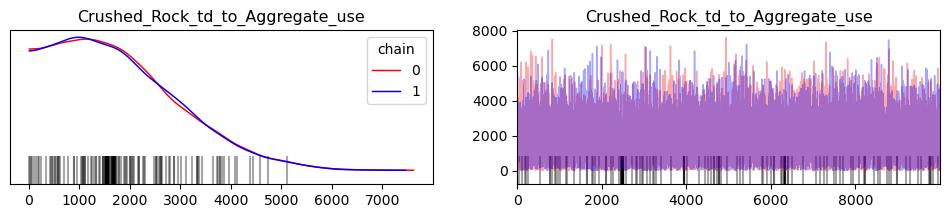

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


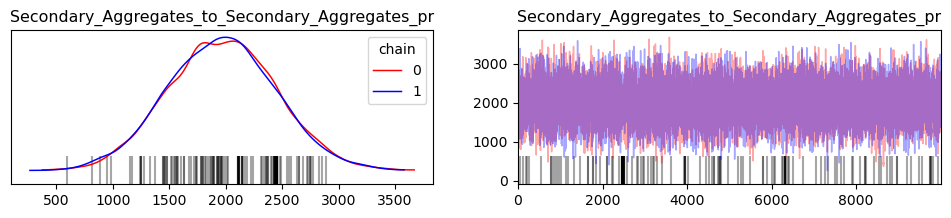

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


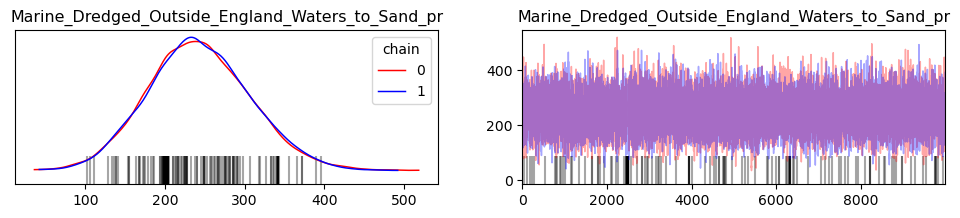

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\xarray\core\utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(


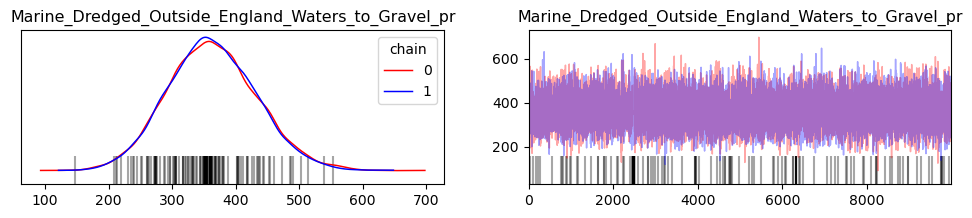

In [7]:
#generate traceplots for the flow variables

az.rcParams["plot.max_subplots"] = 400 #this increases the maximum plots displayed, default is 40.
#There are around 200 posterior flow plots so without this you only plot the first 40. 

plt.tight_layout()


for i in range(0, len(availablechildflows)):
    relevantrow=np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow=relevantrow[0][0]
    flownumberfrom=allflownumbersmatrix[relevantrow, 1]
    flownumberto=allflownumbersmatrix[relevantrow, 2]
    
    labeller = azl.MapLabeller(var_name_map={"flows": processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]})
    posteriorflowtraceplots=az.plot_trace(trace, var_names="flows",compact=True,show=True,backend="matplotlib", coords={'flows_dim_0': [i]},labeller=labeller,legend=True,chain_prop={"color": ['r', 'b']})

    #posteriorflowtraceplots[0,0].get_figure().savefig("outputgraphstrace"+filelabeler(useratiodata)+"/"+"Flowtrace"+processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]+filelabeler(useratiodata)+".pdf")

C:\Users\arm319\Anaconda3\envs\pymc_env\Lib\site-packages\arviz\plots\backends\matplotlib\__init__.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = subplots(rows, cols, **backend_kwargs)


FileNotFoundError: [Errno 2] No such file or directory: 'outputgraphsscenarioB/Recycled_Processing/Production_Waste_to_Crushed_Rock_tdscenarioB.pdf'

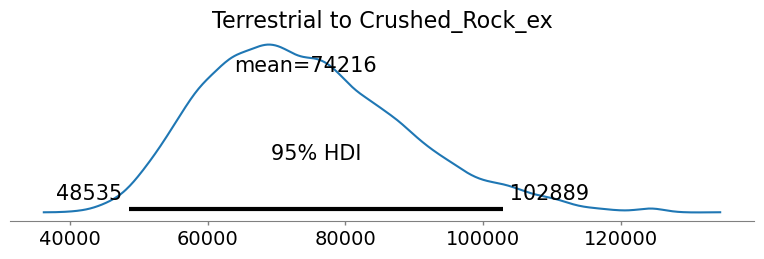

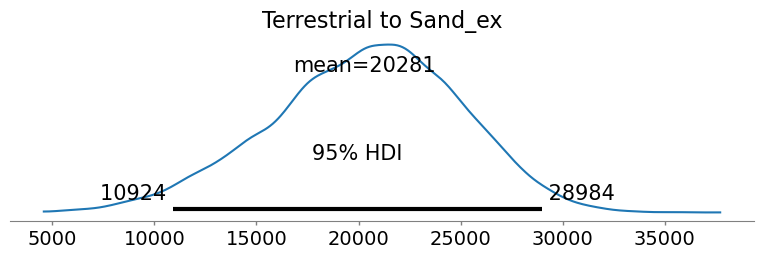

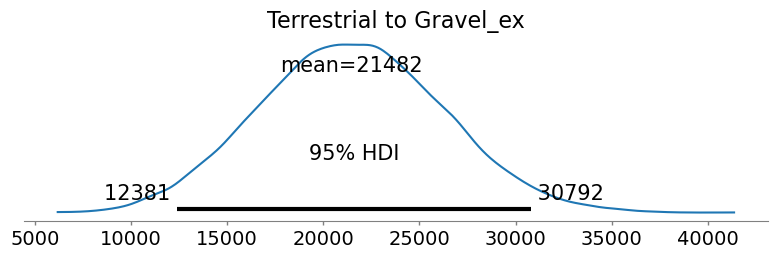

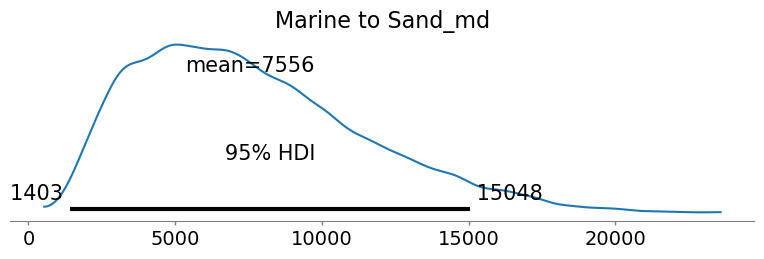

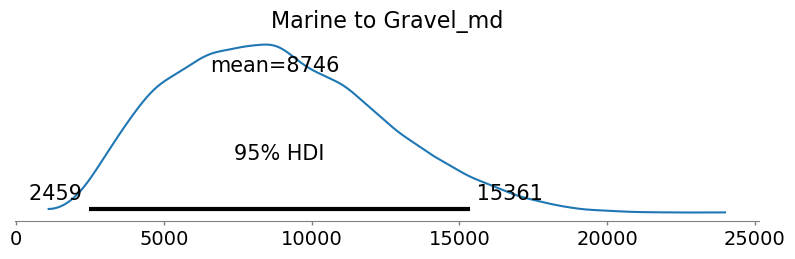

...

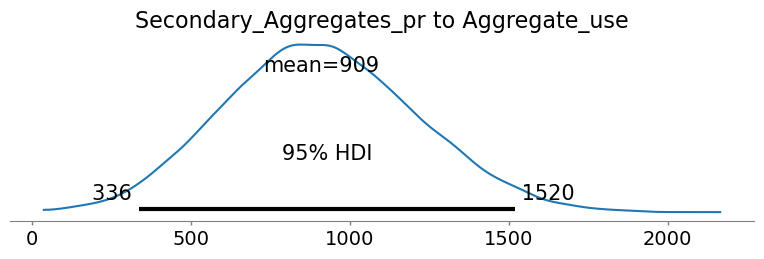

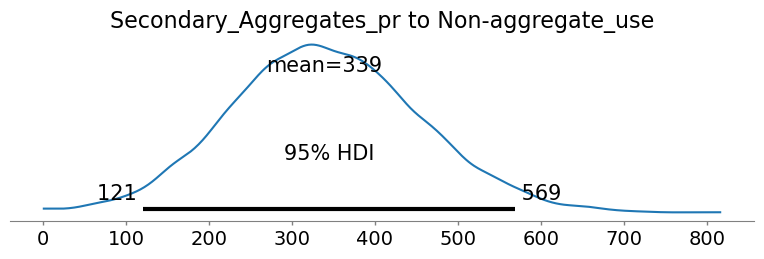

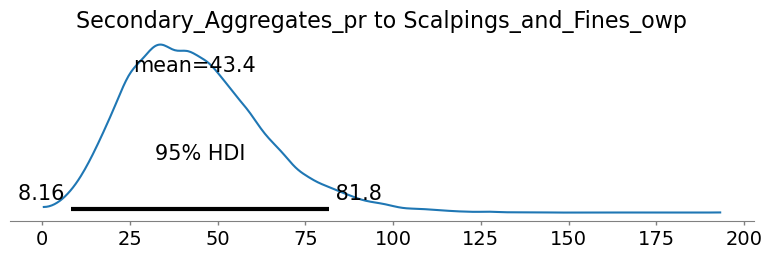

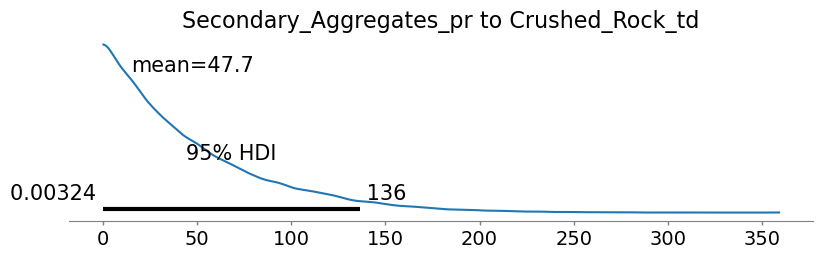

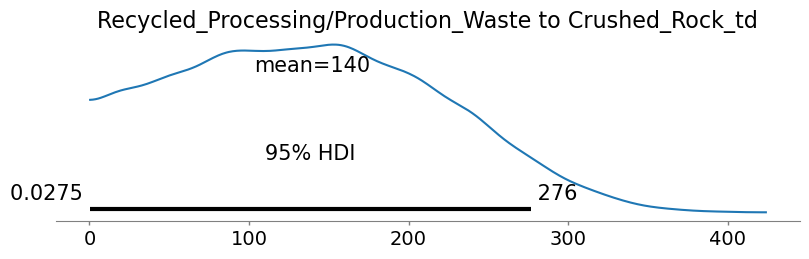

In [8]:
#plot marginal posterior distribution for flow variables
az.rcParams["plot.max_subplots"] = 400 #this increases the maximum plots displayed, default is 40.
#There are around 200 posterior flow plots so without this you only plot the first 40. 

for i in range(0, len(availablechildflows)):
    relevantrow=np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow=relevantrow[0][0]
    flownumberfrom=allflownumbersmatrix[relevantrow, 1]
    flownumberto=allflownumbersmatrix[relevantrow, 2]
    posteriorflowplots=az.plot_posterior(trace, var_names="flows",show=False,backend="matplotlib", round_to=3, hdi_prob=0.95,coords={'flows_dim_0': [i]}, textsize=14, figsize=[9.6, 2.4])
    
   # plt.axvline(x=truevalues[availablechildflows][i], color="red")
    posteriorflowplots.title.set_text(processnamesdict[str(flownumberfrom)]+" to "+processnamesdict[str(flownumberto)])
    posteriorflowplots.get_figure().savefig("outputgraphs"+filelabeler(useratiodata)+"/"+processnamesdict[str(flownumberfrom)]+"_to_"+processnamesdict[str(flownumberto)]+filelabeler(useratiodata)+".pdf")


In [9]:
#posterior predictive samples

posterior_predpmy4=pm.sample_posterior_predictive(trace=trace, model=model, random_seed=123456)

Sampling: [CoM, flowdata, ratiodata, stockdata]


In [21]:
trace.to_netcdf("England2019"+filelabeler(useratiodata)+".nc")
#I had to add 1 after model to get it to save - cannot overwrite existing file and I am unable to delete...
#input this in the mean CoM imballance cell at the end

'England2019scenarioB.nc'

In [22]:
#before pymc4, pm.sample_posterior_predictive would output a dictionary of 
#stockdata, flowdata, CoM and each key contains as 'value' an array of NxP where N is the sample size 
#and P is the number of variables in that key

#After pymc4, it will output xarray dataset with the above 'keys' (such as stockdata), but the values are like
#(chain, draw, stockdata_dim_2) instead. So I feel like what you need to do is concatenate (vertically stack) two chains to make
#(draw, stockdata_dim_2) again, and put that into a dictionary.

#the below code transforms the posterior_pred back into the pymc3 format so the old ppplots function is compatible with it.

posterior_prededit=posterior_predpmy4['posterior_predictive']

print(posterior_prededit)

print('banana')

stockarray=np.vstack((np.array(posterior_prededit['stockdata'][0]),np.array(posterior_prededit['stockdata'][1])))

flowarray=np.vstack((np.array(posterior_prededit['flowdata'][0]),np.array(posterior_prededit['flowdata'][1])))

if useratiodata==1:
    ratioarray=np.vstack((np.array(posterior_prededit['ratiodata'][0]),np.array(posterior_prededit['ratiodata'][1])))

CoMarray=np.vstack((np.array(posterior_prededit['CoM'][0]),np.array(posterior_prededit['CoM'][1])))

#sanity check shape
print(np.shape(stockarray))
print(np.shape(flowarray))
print(np.shape(CoMarray))

if useratiodata==1:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'ratiodata': ratioarray, 'CoM': CoMarray}
else:
    posterior_pred = {'stockdata': stockarray, 'flowdata': flowarray, 'CoM': CoMarray}


<xarray.Dataset>
Dimensions:          (chain: 2, draw: 10000, stockdata_dim_2: 1,
                      flowdata_dim_2: 18, ratiodata_dim_2: 81, CoM_dim_2: 40)
Coordinates:
  * chain            (chain) int32 0 1
  * draw             (draw) int32 0 1 2 3 4 5 ... 9994 9995 9996 9997 9998 9999
  * stockdata_dim_2  (stockdata_dim_2) int32 0
  * flowdata_dim_2   (flowdata_dim_2) int32 0 1 2 3 4 5 6 ... 12 13 14 15 16 17
  * ratiodata_dim_2  (ratiodata_dim_2) int32 0 1 2 3 4 5 6 ... 75 76 77 78 79 80
  * CoM_dim_2        (CoM_dim_2) int32 0 1 2 3 4 5 6 7 ... 33 34 35 36 37 38 39
Data variables:
    stockdata        (chain, draw, stockdata_dim_2) float64 2.226e+03 ... 1.7...
    flowdata         (chain, draw, flowdata_dim_2) float64 7.961e+03 ... 38.84
    ratiodata        (chain, draw, ratiodata_dim_2) float64 0.3907 ... 0.6839
    CoM              (chain, draw, CoM_dim_2) float64 -323.2 82.59 ... -552.8
Attributes:
    created_at:                 2024-11-27T11:10:21.934645
    arviz_version

In [23]:
import pickle

with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'wb') as f:
    pickle.dump(posterior_pred, f)
        
#with open('posteriorpred'+filelabeler(useratiodata)+'.pkl', 'rb') as f:
    #posterior_pred = pickle.load(f)

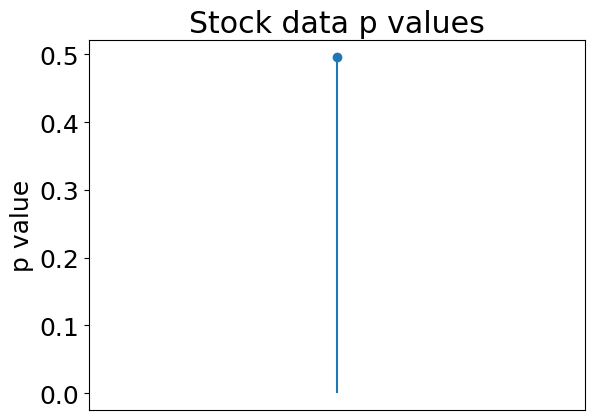

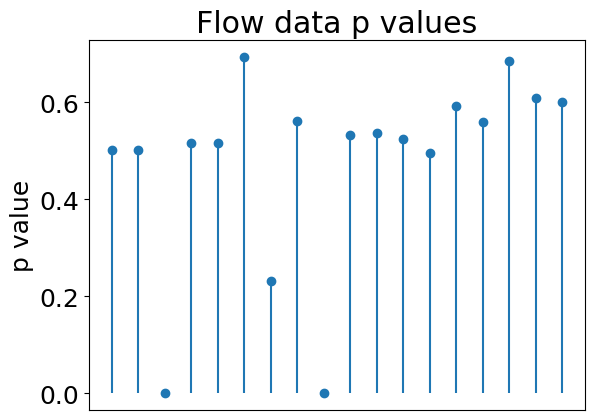

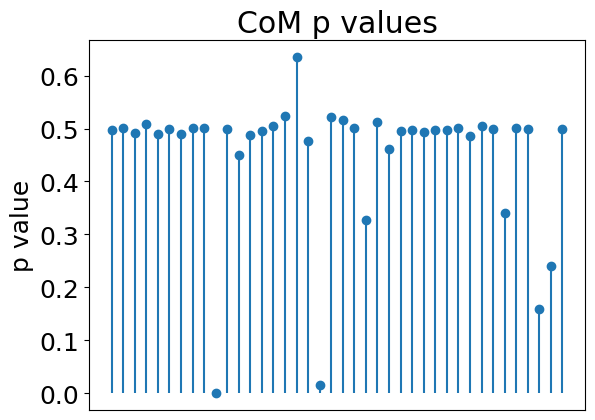

C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:60: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  stock_hdi = az.hdi(posterior_pred['stockdata'], hdi_prob=0.95)
C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:61: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  flow_hdi = az.hdi(posterior_pred['flowdata'], hdi_prob=0.95)
C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:62: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  CoM

check stock data coverage
[[1.67195418e+03 2.95960037e+03 2.32500000e+03 1.00000000e+00]]
check flow data coverage
[[5.48037514e+03 9.57751926e+03 7.57300000e+03 1.00000000e+00]
 [2.10884455e+03 3.63937068e+03 2.86500000e+03 1.00000000e+00]
 [6.44610522e+02 2.47319856e+03 4.05000000e+03 0.00000000e+00]
 [4.41779791e+02 7.74723265e+02 6.00000000e+02 1.00000000e+00]
 [5.78628925e+03 1.01762149e+04 7.98100000e+03 1.00000000e+00]
 [2.82232688e+02 4.74333615e+02 3.52000000e+02 1.00000000e+00]
 [1.20187328e+04 2.21576347e+04 1.91070000e+04 1.00000000e+00]
 [5.22933805e+02 9.17674120e+02 7.11000000e+02 1.00000000e+00]
 [1.46083740e+03 4.10080874e+03 5.63200000e+03 0.00000000e+00]
 [8.51202826e+03 1.48040652e+04 1.15650000e+04 1.00000000e+00]
 [1.74020641e+02 3.02358899e+02 2.36000000e+02 1.00000000e+00]
 [8.63173246e+03 1.52259794e+04 1.18880000e+04 1.00000000e+00]
 [2.69163034e+03 4.77993237e+03 3.77100000e+03 1.00000000e+00]
 [2.24072732e+04 3.77588009e+04 2.91280000e+04 1.00000000e+00]
 [8

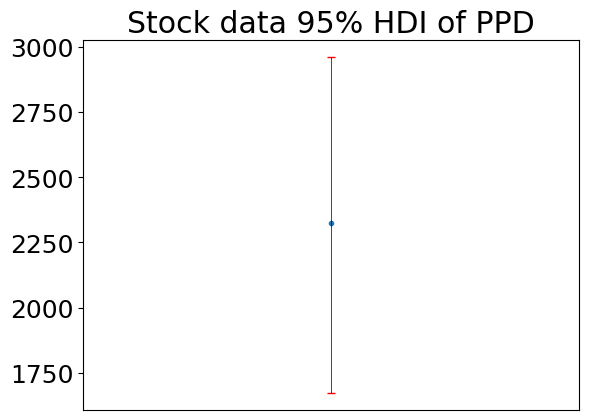

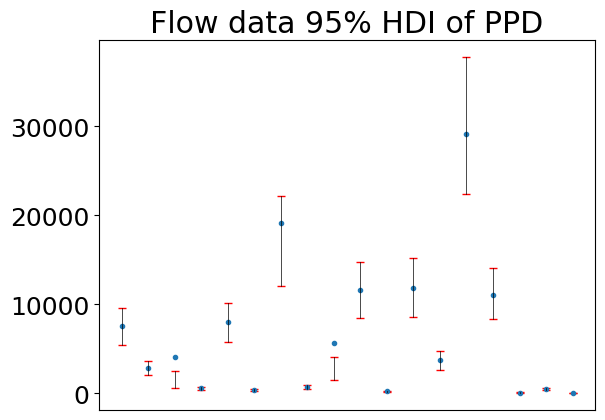

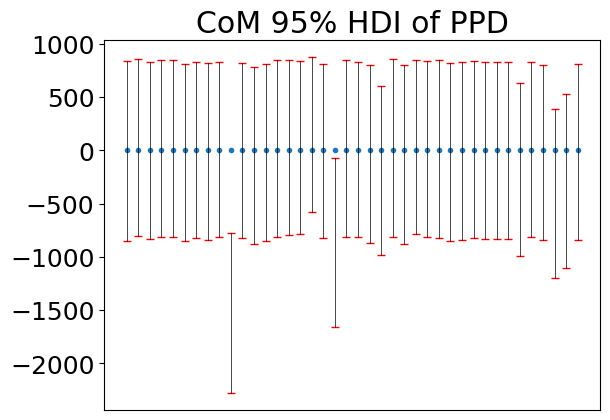

In [24]:
#plot posterior predictive 95% HDI and p values, for flow and change in stock data, and CoM conditions.

import os
directory = "outputgraphsscenarioB"
if not os.path.exists(directory):
    os.makedirs(directory)

ppplots(posterior_pred,datavector,stockindex,flowindex,CoMindex,useratiodata)

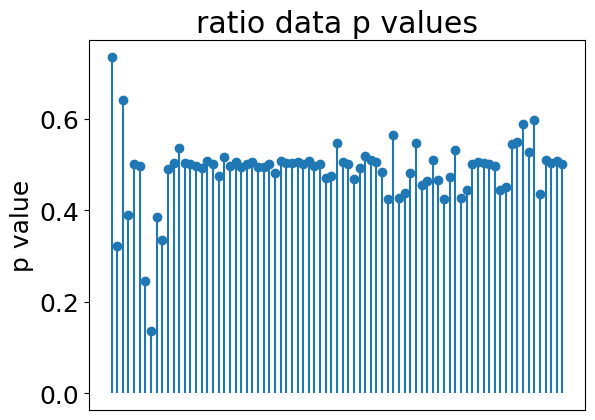

C:\Users\arm319\OneDrive - Imperial College London\BaMFA\Junyang\Paper2material (2)\Paper2material\code\posteriorpredictive.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  ratio_hdi = az.hdi(posterior_pred['ratiodata'], hdi_prob=0.95)


check ratio data coverage
[[ 0.22154945  0.74385681  0.4         1.        ]
 [ 0.14594754  0.88408583  0.6         1.        ]
 [ 0.16022852  0.75505081  0.4         1.        ]
 [ 0.1378147   0.93134872  0.6         1.        ]
 [ 0.10842594  0.71328786  0.4         1.        ]
 [ 0.18775451  0.99617812  0.6         1.        ]
 [-0.01733069  0.42675086  0.28        1.        ]
 [-0.07154654  0.5538037   0.42        1.        ]
 [ 0.0089658   0.20439328  0.12        1.        ]
 [ 0.00534076  0.29671165  0.18        1.        ]
 [ 0.26555923  1.1449724   0.71        1.        ]
 [ 0.00243669  0.05793207  0.03        1.        ]
 [ 0.06549019  0.47879645  0.26        1.        ]
 [ 0.26841009  1.14809908  0.71        1.        ]
 [ 0.00272844  0.05744897  0.03        1.        ]
 [ 0.04678291  0.46143673  0.26        1.        ]
 [ 0.27637144  1.16635704  0.71        1.        ]
 [ 0.00168421  0.05686668  0.03        1.        ]
 [ 0.05633573  0.4777245   0.26        1.        ]
 [ 0.

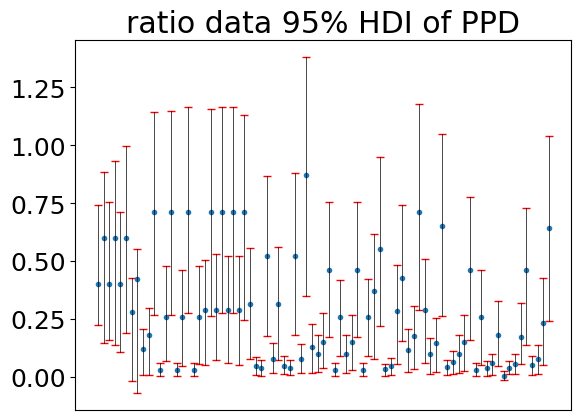

In [25]:
#plot posterior predictive 95% HDI and p values, for ratio data, scenario B only.

ppplotsratiodata(posterior_pred,ratiovector,useratiodata)

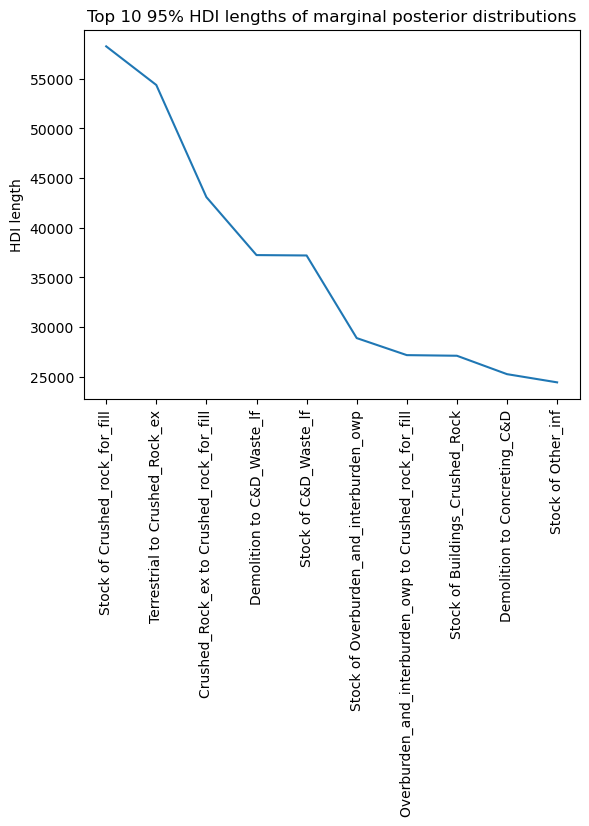

In [26]:
#plot top 10 widths of marginal posterior 95% HDI

ci_95_length=top10hdi(trace,processnamesdict,availablechildstocksandflows,useratiodata,m)

In [27]:
#output information that shows stocks, flows, datavars and the mapping details

#define flow nav
output=az.summary(trace).round(9)
output_flownav = pd.DataFrame(columns=['flownumberfrom', 'flownumberto'])  # Define the columns explicitly
for i in range(0, len(availablechildflows)):
    relevantrow = np.where(allflownumbersmatrix[:, 0] == str(availablechildflows[i]))
    relevantrow = relevantrow[0][0]
    flownumberfrom = allflownumbersmatrix[relevantrow, 1]
    flownumberto = allflownumbersmatrix[relevantrow, 2]
 
    # Add the values to the DataFrame using loc
    output_flownav.loc[len(output_flownav)] = [flownumberfrom, flownumberto]

# Create a DataFrame with two zero-filled columns
output_stocknav = pd.DataFrame({'flownumberfrom': [0] * len(availablechildstocks),
                   'flownumberto': [0] * len(availablechildstocks)})
 
# Create a DataFrame with two zero-filled columns
output_parentnav = pd.DataFrame({'parentflownumberfrom': [0] * len(availablechildstocks+availablechildflows),
                   'parentflownumberto': [0] * len(availablechildstocks+availablechildflows)})
 
output_fsnav = pd.concat([output_stocknav, output_flownav], ignore_index=True)
output_nav = pd.concat([output_parentnav, output_fsnav], axis=1)
output_nav['navigation'] = output_nav['flownumberfrom'].astype(str) + '-' + output_nav['flownumberto'].astype(str)+ '-' + output_nav['parentflownumberfrom'].astype(str) + '-' + output_nav['parentflownumberto'].astype(str)
 
output['flownumberfrom'] = np.nan
output['flownumberto'] = np.nan
output['parentflownumberfrom'] = np.nan
output['parentflownumberto'] = np.nan
output['navigation'] = np.nan
 
output['flownumberfrom'].iloc[:len(output_nav)] = output_nav['flownumberfrom'].astype(str).values
output['flownumberto'].iloc[:len(output_nav)] = output_nav['flownumberto'].astype(str).values
output['parentflownumberfrom'].iloc[:len(output_nav)] = output_nav['parentflownumberfrom'].astype(str).values
output['parentflownumberto'].iloc[:len(output_nav)] = output_nav['parentflownumberto'].astype(str).values
output['navigation'].iloc[:len(output_nav)] = output_nav['navigation'].astype(str).values
 
original_columns = output.columns.tolist()
columns_to_move = ['flownumberfrom', 'flownumberto', 'parentflownumberfrom', 'parentflownumberto', 'navigation']
original_columns = [col for col in original_columns if col not in columns_to_move]
# Define the new column order
new_column_order = columns_to_move + original_columns
# Reorder the columns in the DataFrame
output = output[new_column_order]

C:\Users\arm319\AppData\Local\Temp\ipykernel_41104\1604985028.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '1' '1' '2' '2' '2' '3'
 '3' '3' '4' '4' '4' '5' '5' '5' '6' '6' '6' '7' '7' '7' '7' '7' '7' '7'
 '7' '7' '7' '7' '7' '8' '8' '8' '8' '8' '8' '8' '8' '8' '8' '8' '9' '9'
 '9' '9' '9' '9' '9' '9' '10' '10' '10' '10' '10' '10' '10' '11' '12' '12'
 '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '12' '13'
 '13' '13' '13' '14' '14' '14' '14' '15' '15' '15' '15' '16' '16' '16'
 '16' '17' '17' '17' '18' '18' '18' '19' '19' '19' '20' '20' '20' '21'
 '22' '23' '24' '25' '25' '26' '26' '27' '27' '28' '28' '35' '35' '35'
 '36' '40' '41' '41' '41' '42' '42' '42' '43' '43' '44' '44' '44' '45'
 '45' '46' '46' '46' '47' '48' '48']' has dtype incompatible with float64, please explicitl

In [28]:
#Output the data to [file name].csv
output.to_csv('England2019.csv', index=False)

In [41]:
#Here I am checking the length of CoMindex -- the values involved in datavars (called in the next cell). 
#The no. of child processes is 49
#The no. of datavars is 59 (see earlier output)
#40 CoM values -- some are not CoM enforced, e.g., landfilis 'one sided'

print(f"Total rows in datastocks: {len(datastocks)}")
print(f"Total rows in dataflows: {len(dataflows)}")
print(f"Length of CoMindex: {len(CoMindex)}")
print(f"CoMindex: {CoMindex}")

Total rows in datastocks: 82
Total rows in dataflows: 317
Length of CoMindex: 40
CoMindex: [19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]


check CoM posterior means, scenario A
<xarray.DataArray 'datavars' (datavars_dim_0: 40)>
array([-1.20244578e+00,  2.34499917e+00, -8.77189065e+00,  8.52910378e+00,
       -1.02419038e+01,  3.37207104e+00, -1.16315320e+01,  1.89348877e+00,
       -3.16082680e+00, -1.52095647e+03, -2.76040851e-01, -5.37525011e+01,
       -6.48881060e+00, -2.86059016e+00,  2.33428659e+00,  2.95874138e+01,
        1.38646063e+02, -2.90136083e+01, -8.66646695e+02,  2.15464770e+01,
        1.99478781e+01,  2.83934655e+00, -1.80670791e+02,  1.30649339e+01,
       -4.43793447e+01, -3.34169032e+00, -6.14443353e+00, -5.84809400e+00,
       -3.10411203e+00, -2.87382059e-02,  1.25525422e-01, -1.13933371e+01,
        9.89302713e-01,  1.91690308e+00, -1.68831654e+02,  3.57988822e-01,
       -3.33744654e-01, -4.01703752e+02, -2.96810979e+02, -4.95715032e+00])
Coordinates:
  * datavars_dim_0  (datavars_dim_0) int32 19 20 21 22 23 24 ... 54 55 56 57 58


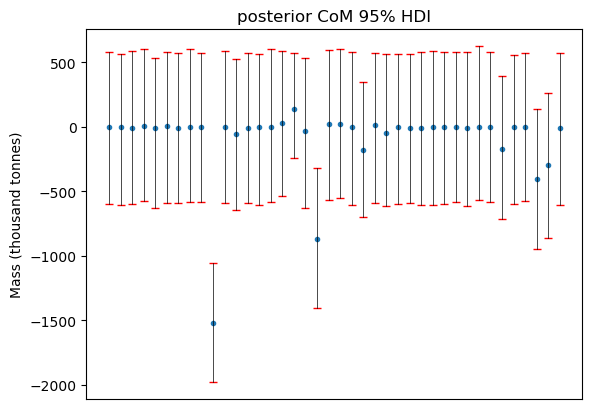

In [50]:
#code for plotting posterior mass conservation conditions:

traceA = az.from_netcdf("England2019scenarioB.nc") #the nc file saved earlier

traceAdatasample = traceA['posterior'].datavars

traceAdatamean=np.mean(traceAdatasample,axis=(0,1))

traceAdatasamplesoutput = np.vstack((traceAdatasample[0, :, :], traceAdatasample[1, :, :]))
traceAdatasamplestest = np.mean(traceAdatasamplesoutput, axis=0)

print('check CoM posterior means, scenario A')
print(traceAdatamean[CoMindex])

#earlier set-up in origial codebase
traceAhdi=az.hdi(traceA['posterior'], hdi_prob=0.95)
traceAhdistocks=traceAhdi['stocks']
traceAhdiflows=traceAhdi['flows']
traceAhdidatavars=traceAhdi['datavars']

plt.plot(traceAhdidatavars[CoMindex, 0], linestyle='None', marker='_', color='red')
plt.plot(traceAhdidatavars[CoMindex, 1], linestyle='None', marker='_', color='red')
plt.plot(traceAdatamean[CoMindex], linestyle='None', marker='.')
plt.plot((range(0, traceAhdidatavars[CoMindex, 0].size), range(0, traceAhdidatavars[CoMindex, 1].size)), (traceAhdidatavars[CoMindex, 0], traceAhdidatavars[CoMindex, 1]),color='black', linewidth=0.5)
plt.ylabel('Mass (thousand tonnes)')
plt.title('posterior CoM 95% HDI')
plt.xticks([])
#plt.savefig('outputgraphs' + filelabeler(useratiodata) + '/' + 'posteriorCoMhdi' + filelabeler(useratiodata) + '.pdf',bbox_inches="tight")
plt.savefig('outputgraphs' + 'scenarioB' + '/' + 'posteriorCoMhdi' + 'scenarioB' + '.png',bbox_inches="tight")
plt.show()

In [51]:
abs_mean_imbalance = np.mean(np.abs(traceAdatamean[CoMindex]))
print(f"mean of the absolute mass imbalances in the posterior: {abs_mean_imbalance}")

mean of the absolute mass imbalances in the posterior: <xarray.DataArray 'datavars' ()>
array(97.25117302)
